In [ ]:
!pip install vispm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [1]:
!pip install -U -q pm4py

import pandas as pd
import numpy as np
import pm4py
import seaborn as sns
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

     |████████████████████████████████| 1.5 MB 7.2 MB/s 
     |████████████████████████████████| 748 kB 45.2 MB/s 
     |████████████████████████████████| 40 kB 2.6 MB/s 
     |████████████████████████████████| 1.6 MB 44.9 MB/s 
Mounted at /content/drive


In [2]:
#move to the directory where the module are located for duration_statistics_module  and social_network_analysis_module
%cd /content/drive/MyDrive/Abou Keita - Capstone 606/Python Notebooks
import duration_statistics_module 
import social_network_analysis_module

/content/drive/.shortcut-targets-by-id/1ciOd6JJn15yFRl7lXb8wUDf4DEFkFYlV/Abou Keita - Capstone 606/Python Notebooks


# Review Example Large CPM

In [ ]:
# imports the xes files and oupts the first and last activity
review_example_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/review_example_large.xes')
reviewlog= pm4py.convert_to_event_log(review_example_log)
event_log = pm4py.convert_to_event_log(review_example_log)

parsing log, completed traces ::   0%|          | 0/10000 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")
/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


Understanding the datatset for CPM

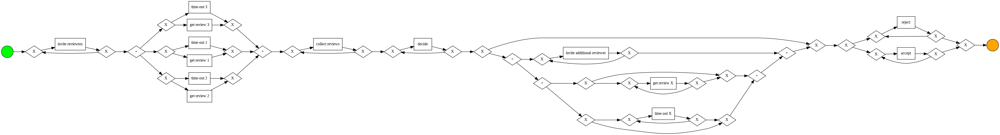

In [ ]:
bpmn_model = pm4py.discover_bpmn_inductive(event_log)
pm4py.view_bpmn(bpmn_model)
#This can be hard to see whats going on, se we gonna take a look at the different other graphs for more clarity

<ipython-input-101-8ccd0ce3085e>:3: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  dfg, start_activities, end_activities = pm4py.discover_dfg(event_log)


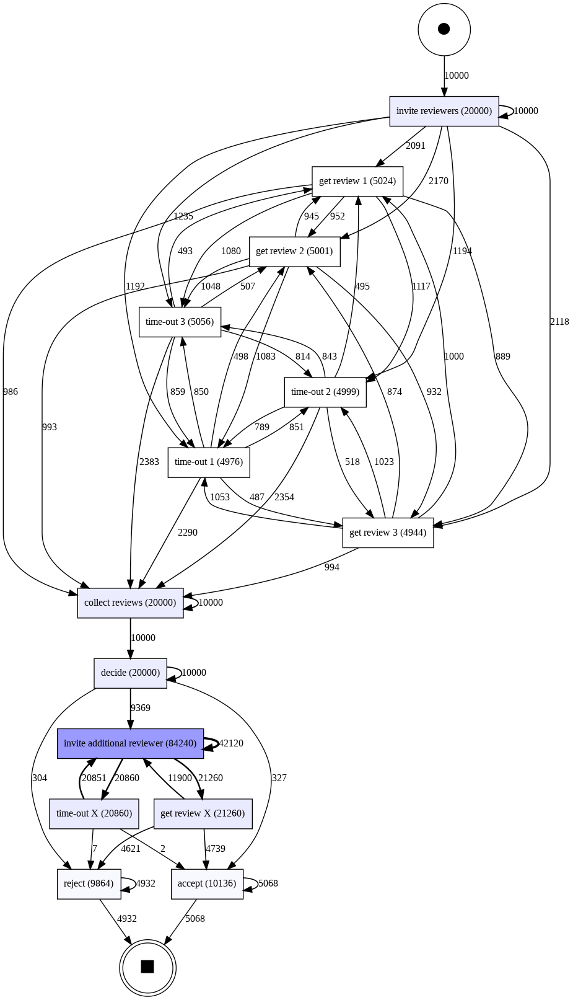

In [ ]:
#Direct follow graph
#with the graph, we can see that only 9 total events that continues after the time-out-x and 7 were rejected.
dfg, start_activities, end_activities = pm4py.discover_dfg(event_log)
pm4py.view_dfg(dfg, start_activities, end_activities)

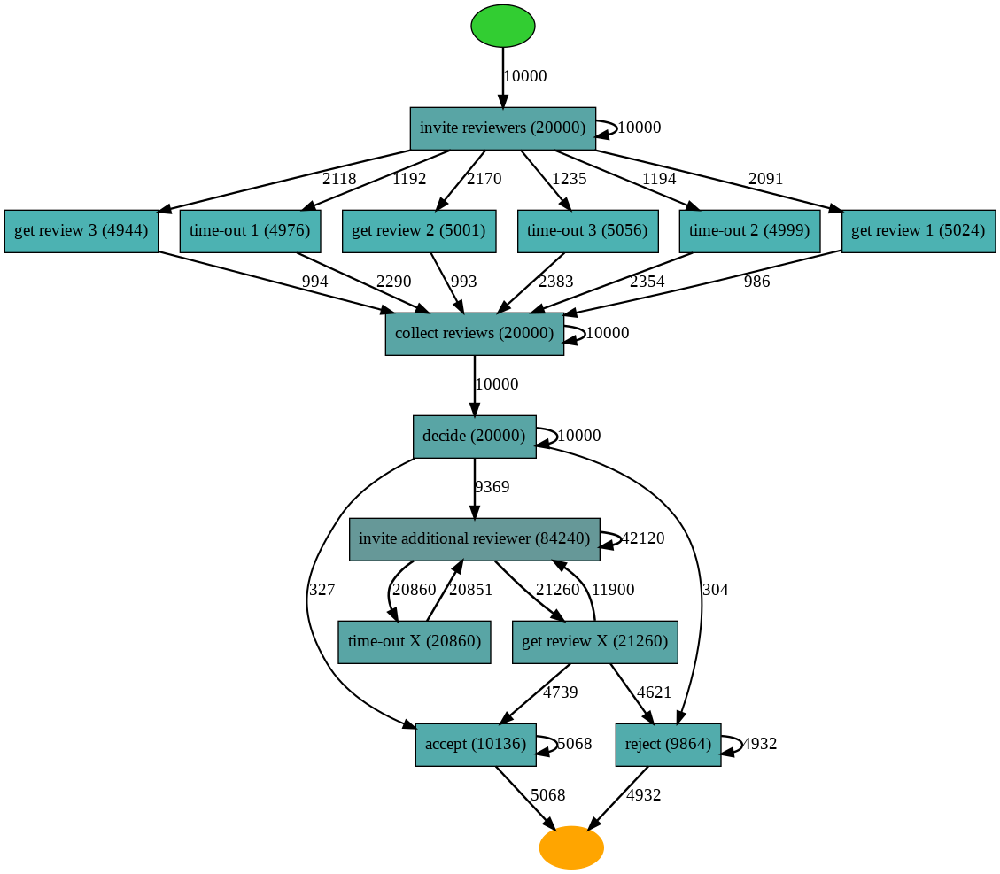

In [ ]:
# Heuritic Miner
# this visualization supports our previous assumption so we will asumme that time-out x has no successor activity
map = pm4py.discover_heuristics_net(event_log)
pm4py.view_heuristics_net(map)

In [ ]:
number_activities = pm4py.get_event_attribute_values(event_log, "concept:name")
number_activities

{'invite reviewers': 20000,
 'get review 3': 4944,
 'get review 1': 5024,
 'time-out 2': 4999,
 'collect reviews': 20000,
 'decide': 20000,
 'invite additional reviewer': 84240,
 'get review X': 21260,
 'reject': 9864,
 'time-out 1': 4976,
 'get review 2': 5001,
 'time-out X': 20860,
 'accept': 10136,
 'time-out 3': 5056}

In [ ]:
# convert to a pandas dataframe and display first 50 rows
df_eventlog = pm4py.convert_to_dataframe(event_log)
df_eventlog.head(50)

,org:resource,time:timestamp,concept:name,lifecycle:transition,result,case:concept:name,case:description
0,Mike,2005-12-31 23:00:00+00:00,invite reviewers,start,NaN,1,Simulated process instance
1,Mike,2006-01-04 23:00:00+00:00,invite reviewers,complete,NaN,1,Simulated process instance
2,Mary,2006-01-04 23:00:00+00:00,get review 3,complete,reject,1,Simulated process instance
3,Pam,2006-01-05 23:00:00+00:00,get review 1,complete,reject,1,Simulated process instance
4,__INVALID__,2006-01-14 23:00:00+00:00,time-out 2,complete,NaN,1,Simulated process instance
5,Anne,2006-01-15 23:00:00+00:00,collect reviews,start,NaN,1,Simulated process instance
6,Anne,2006-01-15 23:00:00+00:00,collect reviews,complete,NaN,1,Simulated process instance
7,Wil,2006-01-15 23:00:00+00:00,decide,start,NaN,1,Simulated process instance
8,Wil,2006-01-16 23:00:00+00:00,decide,complete,NaN,1,Simulated process instance
9,Mike,2006-01-16 23:00:00+00:00,invite additional reviewer,start,NaN,1,Simulated process instance


In [ ]:
#num of event, cases, resources invovled
num_event = len(df_eventlog)
num_cases = len(df_eventlog['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(num_event, num_cases))
ppl_invovled = df_eventlog['org:resource'].unique()
num_ppl_invovled = len(df_eventlog['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(ppl_invovled, num_ppl_invovled))

number of event: 236360 
 Number of unique cases: 10000
The resources or people invovled are: ['Mike' 'Mary' 'Pam' '__INVALID__' 'Anne' 'Wil' 'Carol' 'Pete' 'Sara'
 'John' 'Sam'] 
 The number of resources are: 11


In [ ]:
df_eventlog['concept:name'].unique()

array(['invite reviewers', 'get review 3', 'get review 1', 'time-out 2',
       'collect reviews', 'decide', 'invite additional reviewer',
       'get review X', 'reject', 'time-out 1', 'get review 2',
       'time-out X', 'accept', 'time-out 3'], dtype=object)

In [ ]:
#There are 14 activites involved
df_eventlog['concept:name'].nunique()

14

Critical Path Method

In [ ]:
df_eventlog = review_example_log

In [ ]:
#create a copy of the original df that will be used to find the critical path
cpm_df = df_eventlog.copy(deep=True)
cpm_df

,org:resource,time:timestamp,concept:name,lifecycle:transition,case:concept:name,case:description,result
0,Mike,2005-12-31 23:00:00+00:00,invite reviewers,start,1,Simulated process instance,NaN
1,Mike,2006-01-04 23:00:00+00:00,invite reviewers,complete,1,Simulated process instance,NaN
2,Mary,2006-01-04 23:00:00+00:00,get review 3,complete,1,Simulated process instance,reject
3,Pam,2006-01-05 23:00:00+00:00,get review 1,complete,1,Simulated process instance,reject
4,__INVALID__,2006-01-14 23:00:00+00:00,time-out 2,complete,1,Simulated process instance,NaN
...,...,...,...,...,...,...,...
236355,Anne,2223-07-16 23:00:00+00:00,invite additional reviewer,start,9999,Simulated process instance,NaN
236356,Anne,2223-07-16 23:00:00+00:00,invite additional reviewer,complete,9999,Simulated process instance,NaN
236357,Sam,2223-07-20 23:00:00+00:00,get review X,complete,9999,Simulated process instance,accept
236358,Mike,2223-08-05 23:00:00+00:00,accept,start,9999,Simulated process instance,NaN


In [ ]:
import datetime

# Create a pivot table of the start (minimum) and end (maximum) timestamps associated with each case:
case_starts_ends = cpm_df.pivot_table(index='case:concept:name', aggfunc={'time:timestamp': ['min', 'max']}) 
case_starts_ends = case_starts_ends.reset_index() 
case_starts_ends.columns = ['case:concept:name', 'caseend', 'casestart'] 
# Merge with the main event log data so that for each row we have the start and end times.
cpm_df = cpm_df.merge(case_starts_ends, on='case:concept:name') 
# Calculate the relative time by subtracting the process start time from the event timestamp
cpm_df['relativetime'] = cpm_df['time:timestamp'] - cpm_df['casestart']
# Convert relative times to more friendly measures
## seconds
cpm_df['relativetime_s'] = cpm_df['relativetime'].dt.seconds + 86400*cpm_df['relativetime'].dt.days 
## days
cpm_df['relativedays'] = cpm_df['relativetime'].dt.days

In [ ]:
cpm_df

,org:resource,time:timestamp,concept:name,lifecycle:transition,case:concept:name,case:description,result,caseend,casestart,relativetime,relativetime_s,relativedays
0,Mike,2005-12-31 23:00:00+00:00,invite reviewers,start,1,Simulated process instance,NaN,2006-01-27 23:00:00+00:00,2005-12-31 23:00:00+00:00,0 days,0,0
1,Mike,2006-01-04 23:00:00+00:00,invite reviewers,complete,1,Simulated process instance,NaN,2006-01-27 23:00:00+00:00,2005-12-31 23:00:00+00:00,4 days,345600,4
2,Mary,2006-01-04 23:00:00+00:00,get review 3,complete,1,Simulated process instance,reject,2006-01-27 23:00:00+00:00,2005-12-31 23:00:00+00:00,4 days,345600,4
3,Pam,2006-01-05 23:00:00+00:00,get review 1,complete,1,Simulated process instance,reject,2006-01-27 23:00:00+00:00,2005-12-31 23:00:00+00:00,5 days,432000,5
4,__INVALID__,2006-01-14 23:00:00+00:00,time-out 2,complete,1,Simulated process instance,NaN,2006-01-27 23:00:00+00:00,2005-12-31 23:00:00+00:00,14 days,1209600,14
...,...,...,...,...,...,...,...,...,...,...,...,...
236355,Anne,2223-07-16 23:00:00+00:00,invite additional reviewer,start,9999,Simulated process instance,NaN,2223-08-09 23:00:00+00:00,2141-09-04 23:00:00+00:00,29899 days,2583273600,29899
236356,Anne,2223-07-16 23:00:00+00:00,invite additional reviewer,complete,9999,Simulated process instance,NaN,2223-08-09 23:00:00+00:00,2141-09-04 23:00:00+00:00,29899 days,2583273600,29899
236357,Sam,2223-07-20 23:00:00+00:00,get review X,complete,9999,Simulated process instance,accept,2223-08-09 23:00:00+00:00,2141-09-04 23:00:00+00:00,29903 days,2583619200,29903
236358,Mike,2223-08-05 23:00:00+00:00,accept,start,9999,Simulated process instance,NaN,2223-08-09 23:00:00+00:00,2141-09-04 23:00:00+00:00,29919 days,2585001600,29919


In [ ]:
# the average duration of each activities
# we will keep the duration in seconds before converting them to days at the end after finding out the Critical Path
# https://stackoverflow.com/questions/42474951/pandas-get-average-time-interval-within-groups
#import datetime

#Shows the avg duration of each activites throughout the entire event log in seconds
#avg_duration_activity_days = cpm_df.groupby('activity',dropna=True).agg({'timestamp': lambda x: x.diff().astype('timedelta64[s]').mean().astype(int)})
#avg_duration_activity_days

In [ ]:
#import math
#the first column represent the timing in seconds, while the second column represent the timing in days rounded up
#avg_duration_activity_days['avg_duration_days'] = avg_duration_activity_days['timestamp'] / 86400
#avg_duration_activity_days['avg_duration_days'] = avg_duration_activity_days['avg_duration_days'].apply(np.ceil).astype(int)
#avg_duration_activity_days

In [ ]:
#export the dataframe into csv to do the cpm calculation
#cpm_df.to_csv('cmp.csv',index=True, header=True)

Excel of the CPM showwing the ES,EF,LS,LF,Total Float Free Float in seconds

To understand the caluclation of what this means. The link below explains the technique used to find th most optimal path.
1. https://asana.com/resources/critical-path-method
2. https://www.smartsheet.com/critical-path-method

In [ ]:
import pandas
# Now import the csv of the manually calculated Critical Path
cp = pd.read_excel(r"/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/CPM File/Critical Path Methods.xlsx", sheet_name='Review Example Agg Max CPM')
cp

,Activity,Dependency,timestamp_in_days,ES,EF,LS,LF,total_float,free_float
0,invite reviewers,NaN,12.0,0.0,12.0,0.0,12.0,0.0,0.0
1,get review 1,invite reviewers,17.0,12.0,29.0,17.0,34.0,5.0,5.0
2,time-out 1,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
3,get review 2,invite reviewers,17.0,12.0,29.0,17.0,34.0,5.0,5.0
4,time-out 2,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
5,get review 3,invite reviewers,17.0,12.0,29.0,17.0,34.0,0.0,5.0
6,time-out 3,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
7,collect reviews,"get review 1,time-out 1,get review 2,time-out ...",250.0,34.0,284.0,34.0,284.0,0.0,0.0
8,decide,collect reviews,251.0,284.0,535.0,284.0,535.0,0.0,87108.0
9,invite additional reviewer,decide,87108.0,535.0,87643.0,535.0,87643.0,0.0,0.0


In [ ]:
import numpy as np
cp = cp.replace(np.nan, '', regex=True)
cp

,Activity,Dependency,timestamp_in_days,ES,EF,LS,LF,total_float,free_float
0,invite reviewers,,12.0,0.0,12.0,0.0,12.0,0.0,0.0
1,get review 1,invite reviewers,17.0,12.0,29.0,17.0,34.0,5.0,5.0
2,time-out 1,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
3,get review 2,invite reviewers,17.0,12.0,29.0,17.0,34.0,5.0,5.0
4,time-out 2,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
5,get review 3,invite reviewers,17.0,12.0,29.0,17.0,34.0,0.0,5.0
6,time-out 3,invite reviewers,22.0,12.0,34.0,12.0,34.0,0.0,0.0
7,collect reviews,"get review 1,time-out 1,get review 2,time-out ...",250.0,34.0,284.0,34.0,284.0,0.0,0.0
8,decide,collect reviews,251.0,284.0,535.0,284.0,535.0,0.0,87108.0
9,invite additional reviewer,decide,87108.0,535.0,87643.0,535.0,87643.0,0.0,0.0


In [ ]:
# we will only focus on the activities with total_floar ==0.
# the activites are on the cp
#highlight activities on cp

#https://www.geeksforgeeks.org/highlight-pandas-dataframes-specific-columns-using-applymap/?ref=rp

# function definition
def highlight_cols(s):
   # return 'background-color: % s' % 'red'
   return 'background-color: % s' % 'red'
  
# highlighting the cells
display(cp.style.applymap(highlight_cols, 
                          subset = pd.IndexSlice[cp.total_float ==0, :]))

# The activities on the cp are: invite reviewers, get review,collect reviews,decide,invite additional reviewer, Time_out ore get review, and finally rejecting

,Activity,Dependency,timestamp_in_days,ES,EF,LS,LF,total_float,free_float
0,invite reviewers,,12.000000,0.000000,12.000000,0.000000,12.000000,0.000000,0.000000
1,get review 1,invite reviewers,17.000000,12.000000,29.000000,17.000000,34.000000,5.000000,5.000000
2,time-out 1,invite reviewers,22.000000,12.000000,34.000000,12.000000,34.000000,0.000000,0.000000
3,get review 2,invite reviewers,17.000000,12.000000,29.000000,17.000000,34.000000,5.000000,5.000000
4,time-out 2,invite reviewers,22.000000,12.000000,34.000000,12.000000,34.000000,0.000000,0.000000
5,get review 3,invite reviewers,17.000000,12.000000,29.000000,17.000000,34.000000,0.000000,5.000000
6,time-out 3,invite reviewers,22.000000,12.000000,34.000000,12.000000,34.000000,0.000000,0.000000
7,collect reviews,"get review 1,time-out 1,get review 2,time-out 2,get review 3,time-out 3",250.000000,34.000000,284.000000,34.000000,284.000000,0.000000,0.000000
8,decide,collect reviews,251.000000,284.000000,535.000000,284.000000,535.000000,0.000000,87108.000000
9,invite additional reviewer,decide,87108.000000,535.000000,87643.000000,535.000000,87643.000000,0.000000,0.000000


In [ ]:
# the total duration of the event using this method
td = ['total duration']
total_duration = cp.loc[cp.Activity == 'total duration', 'Dependency'].iloc[0]
print('The relative total duration using the Critical Method is {} days'.format(total_duration) )

The relative total duration using the Critical Method is 261865 days


Get a petri net model representing the Critical Path 

In [ ]:
# output a dataframe with only the activites in the cp
rows= ['invite reviewers','time-out 1','time-out 2','time-out 3','collect reviews','decide','invite', 'additional' ,'reviewer','get review X','reject']
cp_df =df_eventlog[df_eventlog['concept:name'].isin(rows)]

In [ ]:
cp_df

,org:resource,time:timestamp,concept:name,lifecycle:transition,result,case:concept:name,case:description
0,Mike,2005-12-31 23:00:00+00:00,invite reviewers,start,NaN,1,Simulated process instance
1,Mike,2006-01-04 23:00:00+00:00,invite reviewers,complete,NaN,1,Simulated process instance
4,__INVALID__,2006-01-14 23:00:00+00:00,time-out 2,complete,NaN,1,Simulated process instance
5,Anne,2006-01-15 23:00:00+00:00,collect reviews,start,NaN,1,Simulated process instance
6,Anne,2006-01-15 23:00:00+00:00,collect reviews,complete,NaN,1,Simulated process instance
...,...,...,...,...,...,...,...
236341,Wil,2141-09-30 23:00:00+00:00,decide,start,NaN,9999,Simulated process instance
236342,Wil,2141-10-02 23:00:00+00:00,decide,complete,NaN,9999,Simulated process instance
236348,Sara,2166-01-08 23:00:00+00:00,get review X,complete,accept,9999,Simulated process instance
236351,Carol,2208-07-10 23:00:00+00:00,get review X,complete,accept,9999,Simulated process instance


In [ ]:
# convert the dataframe to an event log
cp_event_log = pm4py.convert_to_event_log(cp_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


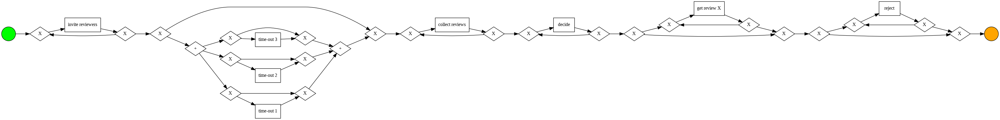

In [ ]:
# show the bpmn model
cp_bpmn_model = pm4py.discover_bpmn_inductive(cp_event_log)
pm4py.view_bpmn(cp_bpmn_model)

<ipython-input-123-f8923c35fd7e>:2: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(cp_event_log)


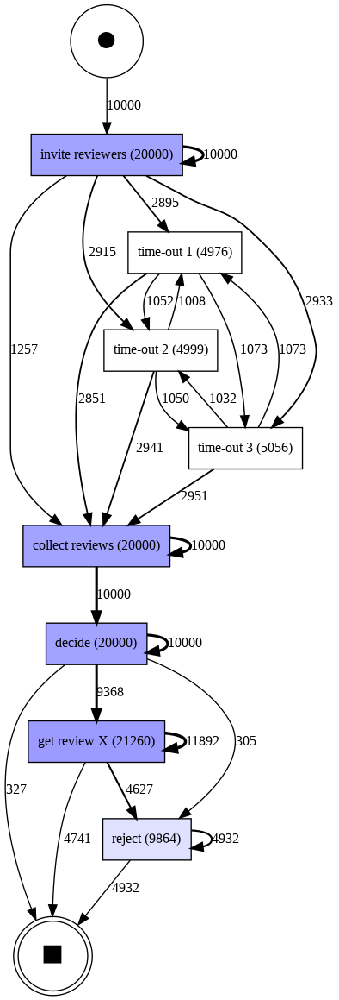

In [ ]:
#show the dfg model
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(cp_event_log)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

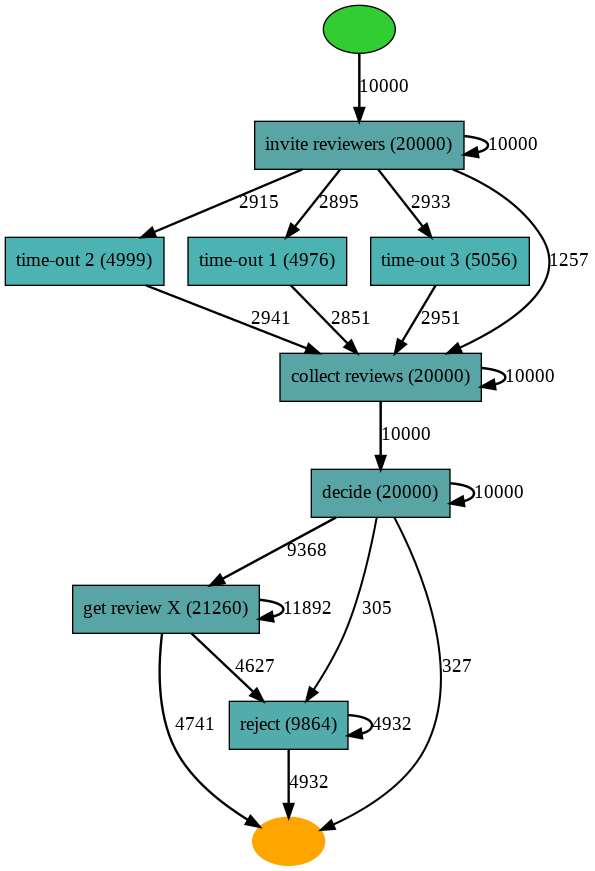

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(cp_event_log)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
num_event = len(cp_df)
num_cases = len(cp_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(num_event, num_cases))
ppl_invovled = cp_df['org:resource'].unique()
num_ppl_invovled = len(cp_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(ppl_invovled, num_ppl_invovled))

number of event: 106155 
 Number of unique cases: 10000
The resources or people invovled are: ['Mike' '__INVALID__' 'Anne' 'Wil' 'Mary' 'Pete' 'Sara' 'Pam' 'Carol'
 'John' 'Sam'] 
 The number of resources are: 11


### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

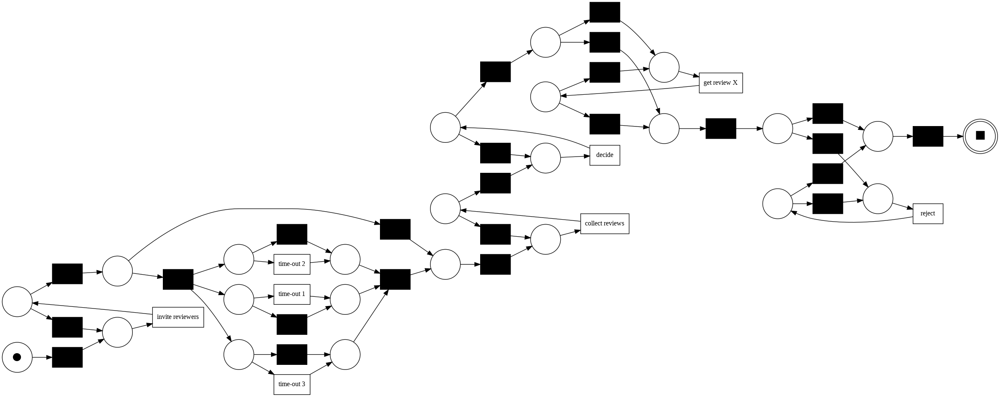

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


/usr/local/lib/python3.8/dist-packages/pm4py/util/lp/variants/scipy_solver.py:26: OptimizeWarning: A_eq does not appear to be of full row rank. To improve performance, check the problem formulation for redundant equality constraints.
  sol = linprog(c, A_ub=Aub, b_ub=bub, A_eq=Aeq, b_eq=beq, method="revised simplex")


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'percFitTraces': 0.0,
 'averageFitness': 0.5498386638410382,
 'percentage_of_fitting_traces': 0.0,
 'average_trace_fitness': 0.5498386638410382,
 'log_fitness': 0.5111194710365281}

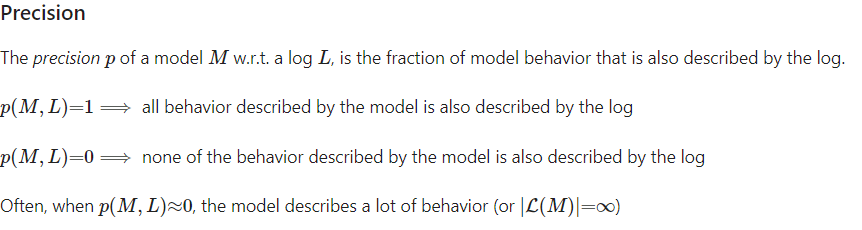

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/22764 [00:00<?, ?it/s]

0.29172845805258985

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/22764 [00:00<?, ?it/s]

0.46277259578274577

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

{'alignment': [('>>', None),
  ('invite reviewers', 'invite reviewers'),
  ('>>', None),
  ('invite reviewers', 'invite reviewers'),
  ('get review 3', '>>'),
  ('get review 1', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('time-out 2', 'time-out 2'),
  ('>>', None),
  ('>>', None),
  ('collect reviews', 'collect reviews'),
  ('>>', None),
  ('collect reviews', 'collect reviews'),
  ('>>', None),
  ('decide', 'decide'),
  ('>>', None),
  ('decide', 'decide'),
  ('invite additional reviewer', '>>'),
  ('invite additional reviewer', '>>'),
  ('>>', None),
  ('>>', None),
  ('get review X', 'get review X'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('reject', 'reject'),
  ('>>', None),
  ('reject', 'reject'),
  ('>>', None),
  ('>>', None)],
 'cost': 40019,
 'visited_states': 40,
 'queued_states': 111,
 'traversed_arcs': 117,
 'lp_solved': 25,
 'fitness': 0.7647058823529411,
 'bwc': 170010}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/4118 [00:00<?, ?it/s]

0.987325008217647

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.7000000000000001

### Statistics

In [ ]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(cp_event_log)
simple_ga_descritpion

{'1': {'startTime': 1136070000.0,
  'endTime': 1138402800.0,
  'caseDuration': 2332800.0},
 '10': {'startTime': 1139180400.0,
  'endTime': 1200524400.0,
  'caseDuration': 61344000.0},
 '100': {'startTime': 1175641200.0,
  'endTime': 2079817200.0,
  'caseDuration': 904176000.0},
 '1000': {'startTime': 1563231600.0,
  'endTime': 3839958000.0,
  'caseDuration': 2276726400.0},
 '10000': {'startTime': 5418054000.0,
  'endTime': 8504694000.0,
  'caseDuration': 3086640000.0},
 '1001': {'startTime': 1566342000.0,
  'endTime': 3416338800.0,
  'caseDuration': 1849996800.0},
 '1002': {'startTime': 1565650800.0,
  'endTime': 3981740400.0,
  'caseDuration': 2416089600.0},
 '1003': {'startTime': 1564700400.0,
  'endTime': 1671318000.0,
  'caseDuration': 106617600.0},
 '1004': {'startTime': 1561935600.0,
  'endTime': 4571938800.0,
  'caseDuration': 3010003200.0},
 '1005': {'startTime': 1565132400.0,
  'endTime': 3746991600.0,
  'caseDuration': 2181859200.0},
 '1006': {'startTime': 1562454000.0,
  'en

In [ ]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("review example case description.xlsx") 

,1,10,100,1000,10000,1001,1002,1003,1004,1005,...,9990,9991,9992,9993,9994,9995,9996,9997,9998,9999
startTime,1.136070e+09,1.139180e+09,1.175641e+09,1.563232e+09,5.418054e+09,1.566342e+09,1.565651e+09,1.564700e+09,1.561936e+09,1.565132e+09,...,5.413993e+09,5.415030e+09,5.414425e+09,5.415116e+09,5.415808e+09,5.415721e+09,5.418659e+09,5.416672e+09,5.418486e+09,5.417622e+09
endTime,1.138403e+09,1.200524e+09,2.079817e+09,3.839958e+09,8.504694e+09,3.416339e+09,3.981740e+09,1.671318e+09,4.571939e+09,3.746992e+09,...,6.331475e+09,8.783939e+09,6.233065e+09,7.978086e+09,7.604233e+09,8.037529e+09,7.345292e+09,6.557756e+09,5.866470e+09,8.001241e+09
caseDuration,2.332800e+06,6.134400e+07,9.041760e+08,2.276726e+09,3.086640e+09,1.849997e+09,2.416090e+09,1.066176e+08,3.010003e+09,2.181859e+09,...,9.174816e+08,3.368909e+09,8.186400e+08,2.562970e+09,2.188426e+09,2.621808e+09,1.926634e+09,1.141085e+09,4.479840e+08,2.583619e+09


In [ ]:
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("review example case description.xlsx") 

In [ ]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(cp_event_log)
simple_ga_case_duration

[432000.0,
 518400.0,
 518400.0,
 518400.0,
 518400.0,
 604800.0,
 604800.0,
 604800.0,
 604800.0,
 604800.0,
 691200.0,
 691200.0,
 691200.0,
 777600.0,
 777600.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 864000.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 950400.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1036800.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123200.0,
 1123

In [ ]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('cpm review example all_case_durationn.xlsx')

In [ ]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(cp_event_log)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  2654035200.0 second
Median case duration in days:  30718.0 days


### SNA

In [ ]:
social_network_analysis_module.sna.role_discovery(cp_event_log)

Activities: ['collect reviews', 'invite reviewers', 'reject'] Originators importance {'Anne': 24830, 'Mike': 25034}
Activities: ['decide'] Originators importance {'Wil': 20000}
Activities: ['get review X'] Originators importance {'Mary': 3043, 'Pete': 3061, 'Sara': 3049, 'Pam': 3012, 'Carol': 3028, 'John': 3031, 'Sam': 3036}
Activities: ['time-out 1', 'time-out 2', 'time-out 3'] Originators importance {'__INVALID__': 15031}


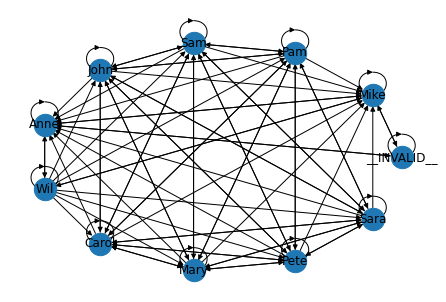

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(cp_event_log)

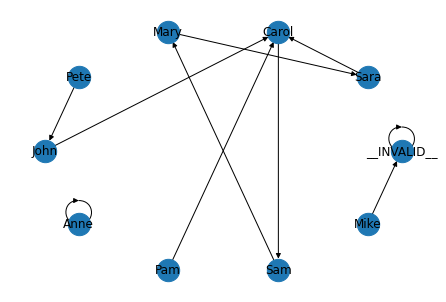

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(cp_event_log)

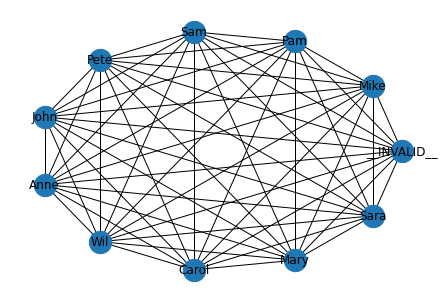

In [ ]:
working_together = social_network_analysis_module.sna.working_together(cp_event_log) 

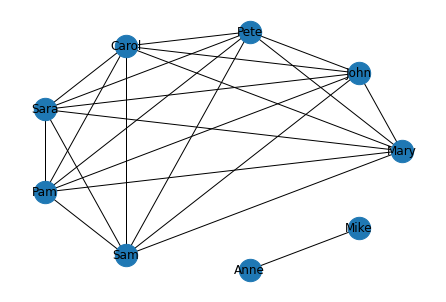

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(cp_event_log) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(cp_event_log) 


group_relative_focus
{'Mike': {'invite reviewers': 0.4975, 'time-out 2': 0.0, 'collect reviews': 0.5028, 'decide': 0.0, 'get review X': 0.0, 'reject': 0.5097323600973236, 'time-out 1': 0.0, 'time-out 3': 0.0}, '__INVALID__': {'invite reviewers': 0.0, 'time-out 2': 1.0, 'collect reviews': 0.0, 'decide': 0.0, 'get review X': 0.0, 'reject': 0.0, 'time-out 1': 1.0, 'time-out 3': 1.0}, 'Anne': {'invite reviewers': 0.5025, 'time-out 2': 0.0, 'collect reviews': 0.4972, 'decide': 0.0, 'get review X': 0.0, 'reject': 0.4902676399026764, 'time-out 1': 0.0, 'time-out 3': 0.0}, 'Wil': {'invite reviewers': 0.0, 'time-out 2': 0.0, 'collect reviews': 0.0, 'decide': 1.0, 'get review X': 0.0, 'reject': 0.0, 'time-out 1': 0.0, 'time-out 3': 0.0}, 'Mary': {'invite reviewers': 0.0, 'time-out 2': 0.0, 'collect reviews': 0.0, 'decide': 0.0, 'get review X': 0.14313264346190027, 'reject': 0.0, 'time-out 1': 0.0, 'time-out 3': 0.0}, 'Pete': {'invite reviewers': 0.0, 'time-out 2': 0.0, 'collect reviews': 0.0, '

In [ ]:
clustering = social_network_analysis_module.sna.clustering(cp_event_log) 

clustered similar activities metric: {'2': ['Mary', 'John', 'Sara', 'Carol'], '0': ['Sam', 'Pam', 'Pete'], '1': ['Mike', 'Wil', 'Anne', '__INVALID__']}
 working together clustered metric: {'0': ['Mary', 'Sam', 'Pam', 'John', 'Sara', 'Carol', 'Pete'], '1': ['Mike', 'Anne'], '2': ['Wil'], '3': ['__INVALID__']}


### EDA

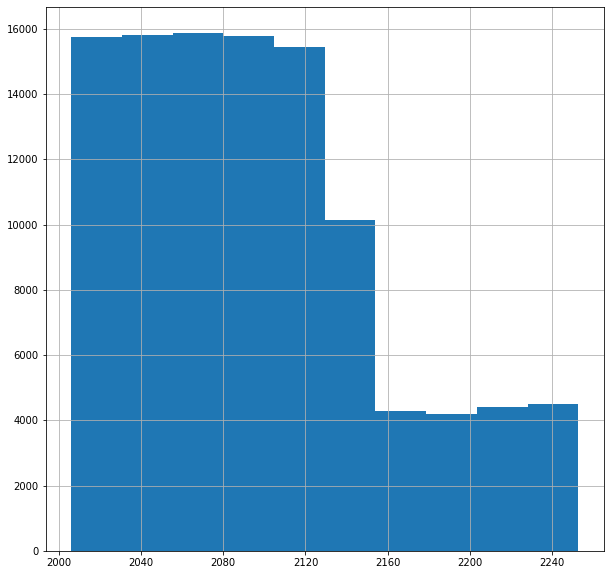

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
cp_df['time:timestamp'].hist()

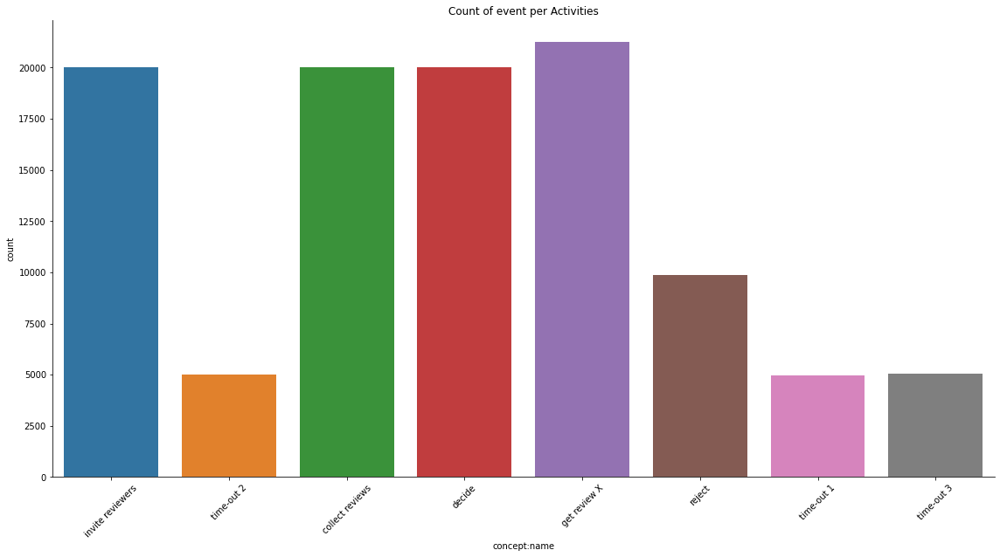

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=cp_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Activities')
plt.show(fig)

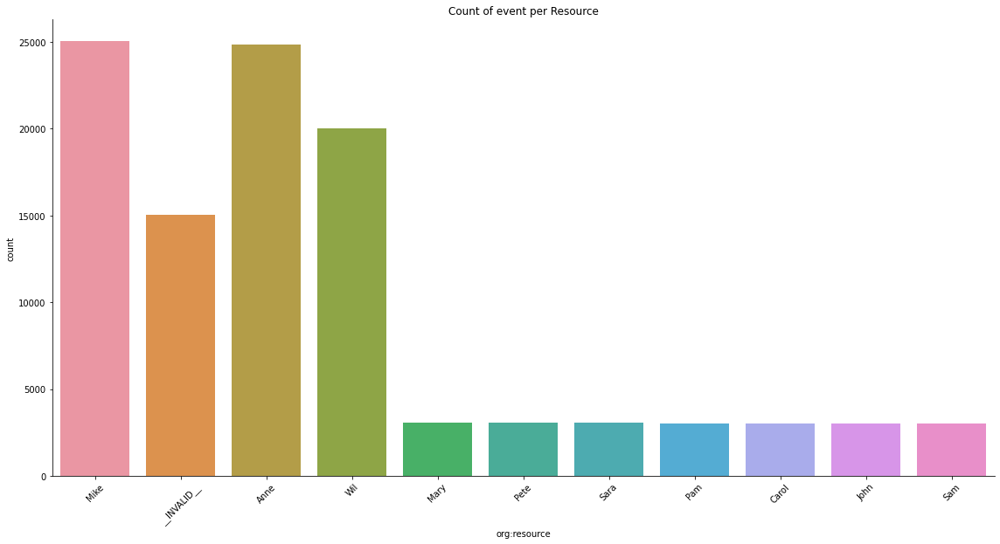

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=cp_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Resource')
plt.show(fig)

In [ ]:
activities = pm4py.get_event_attribute_values(cp_df, "concept:name")
resources = pm4py.get_event_attribute_values(cp_df, "org:resource")

In [ ]:
activities

{'get review X': 21260,
 'invite reviewers': 20000,
 'collect reviews': 20000,
 'decide': 20000,
 'reject': 9864,
 'time-out 3': 5056,
 'time-out 2': 4999,
 'time-out 1': 4976}

In [ ]:
resources

{'Mike': 25034,
 'Anne': 24830,
 'Wil': 20000,
 '__INVALID__': 15031,
 'Pete': 3061,
 'Sara': 3049,
 'Mary': 3043,
 'Sam': 3036,
 'John': 3031,
 'Carol': 3028,
 'Pam': 3012}

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


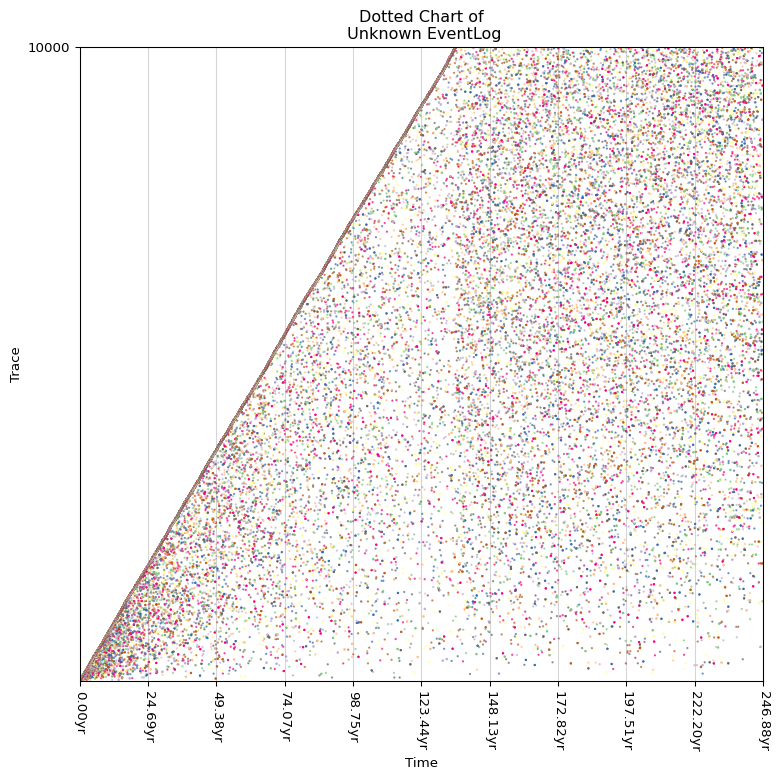

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(cp_event_log)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


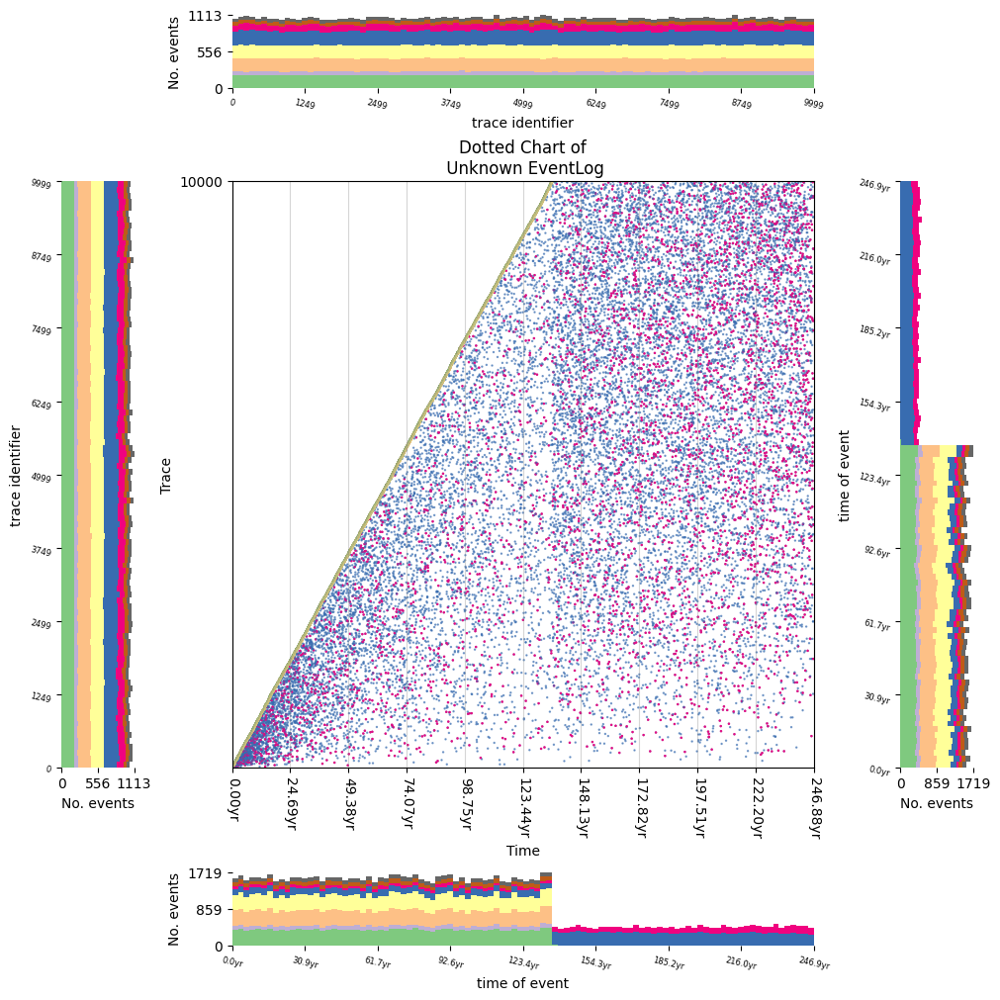

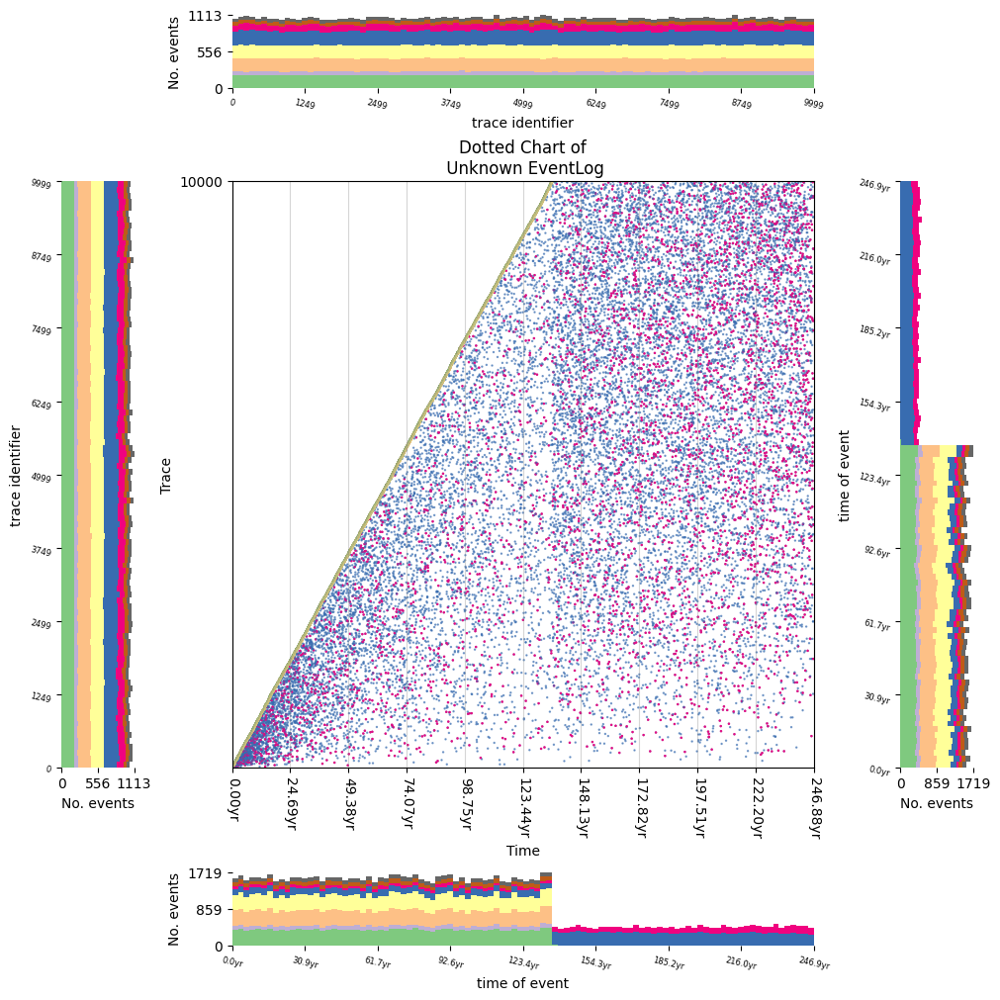

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(cp_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'time-out 1': 'B', 'time-out 2': 'C', 'time-out 3': 'D', 'collect reviews': 'E', 'decide': 'F', 'get review X': 'G', 'reject': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invit

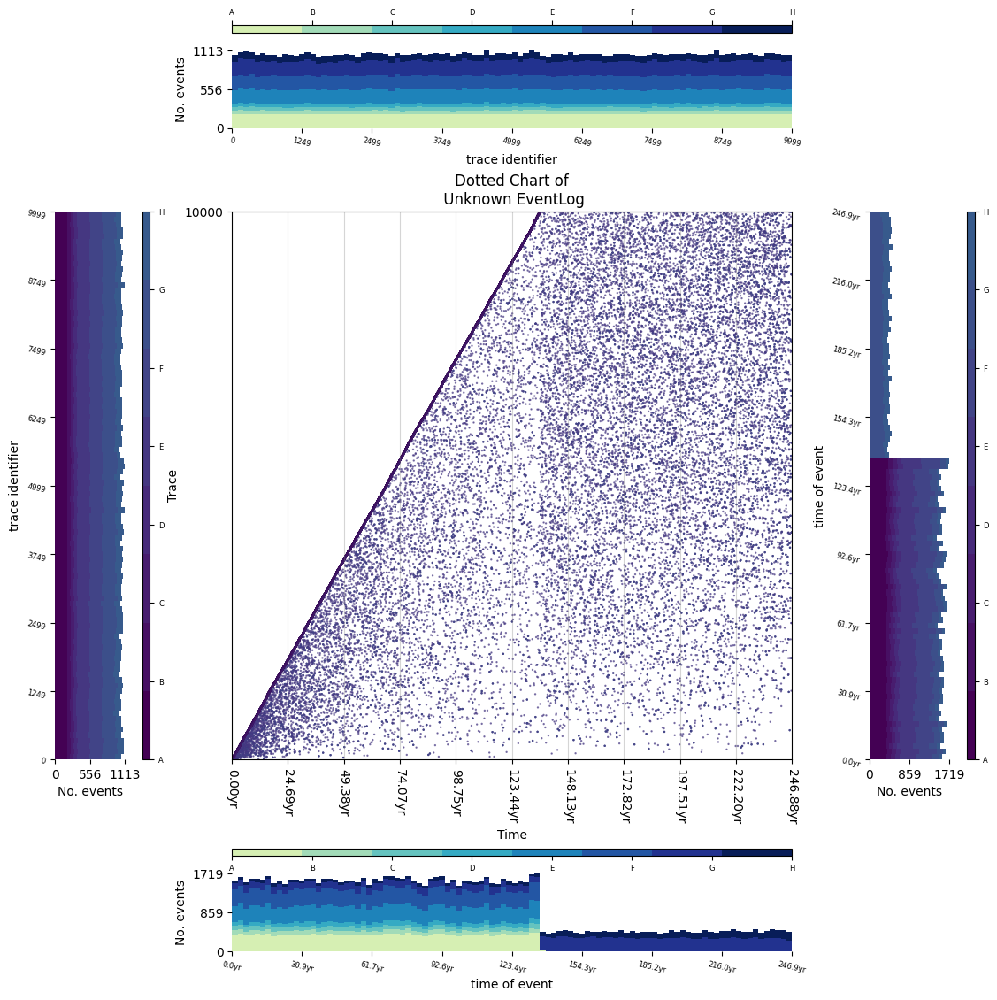

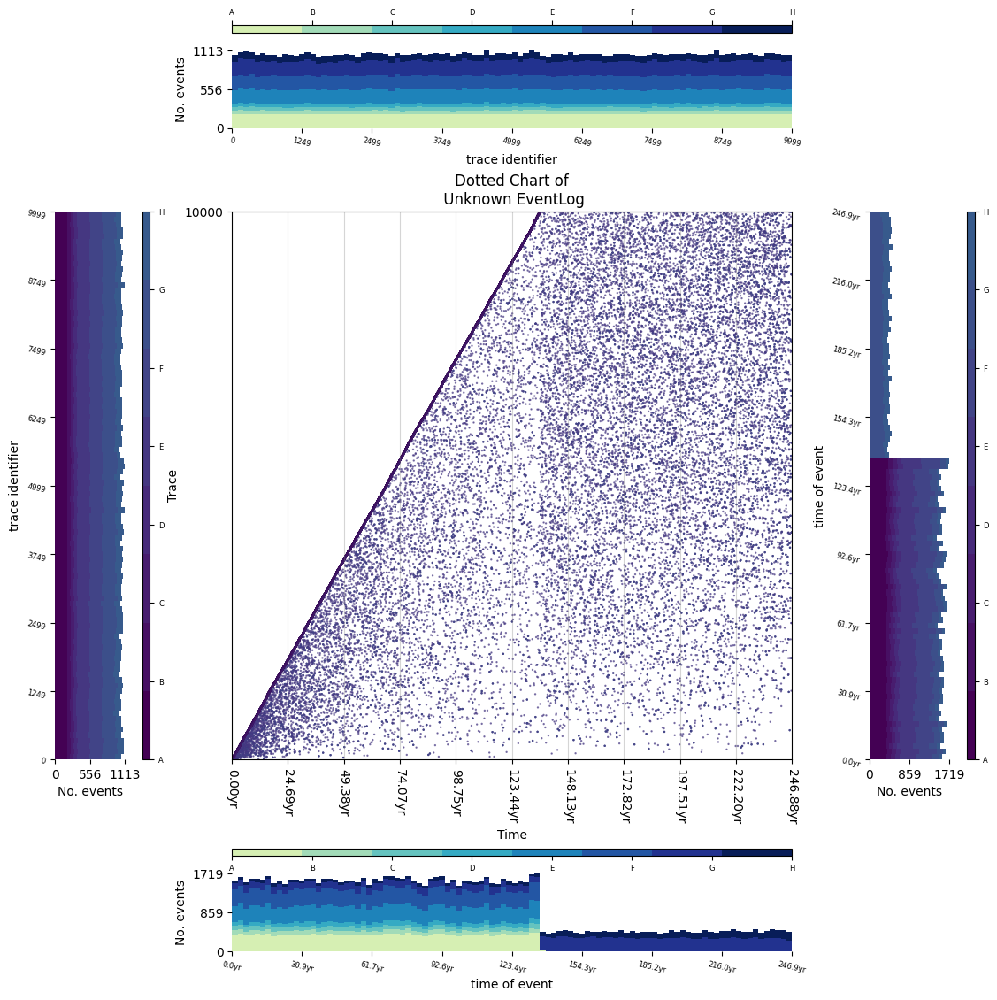

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(cp_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'time-out 1': 'B', 'time-out 2': 'C', 'time-out 3': 'D', 'collect reviews': 'E', 'decide': 'F', 'get review X': 'G', 'reject': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'invit

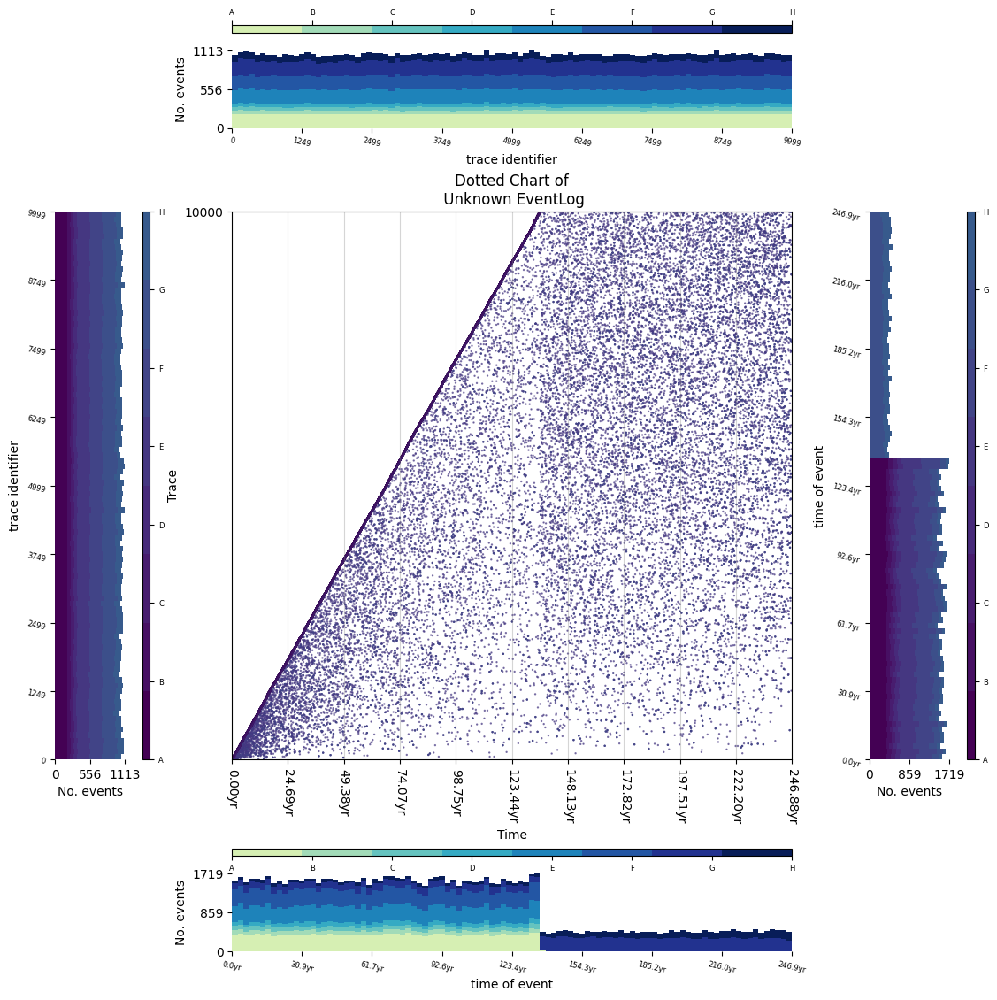

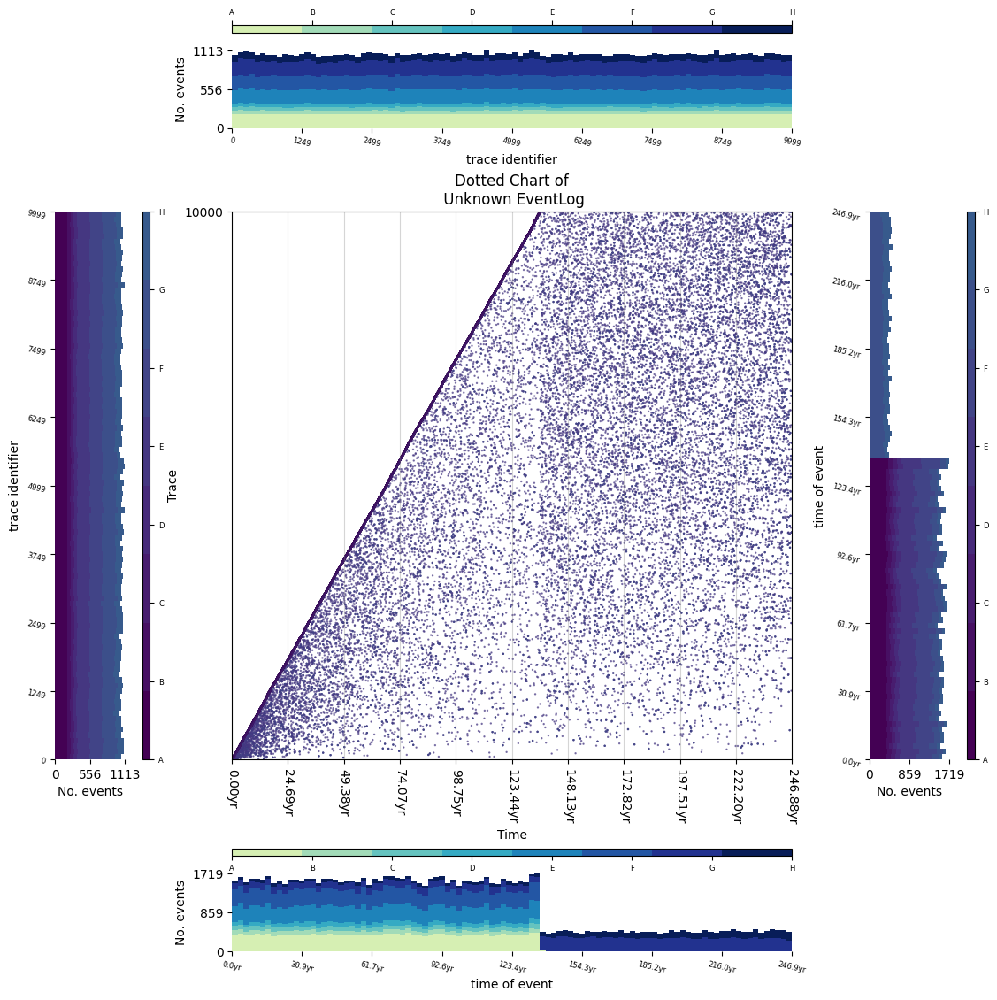

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(cp_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'invite reviewers': 'A', 'time-out 1': 'B', 'time-out 2': 'C', 'time-out 3': 'D', 'collect reviews': 'E', 'decide': 'F', 'get review X': 'G', 'reject': 'H'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramE

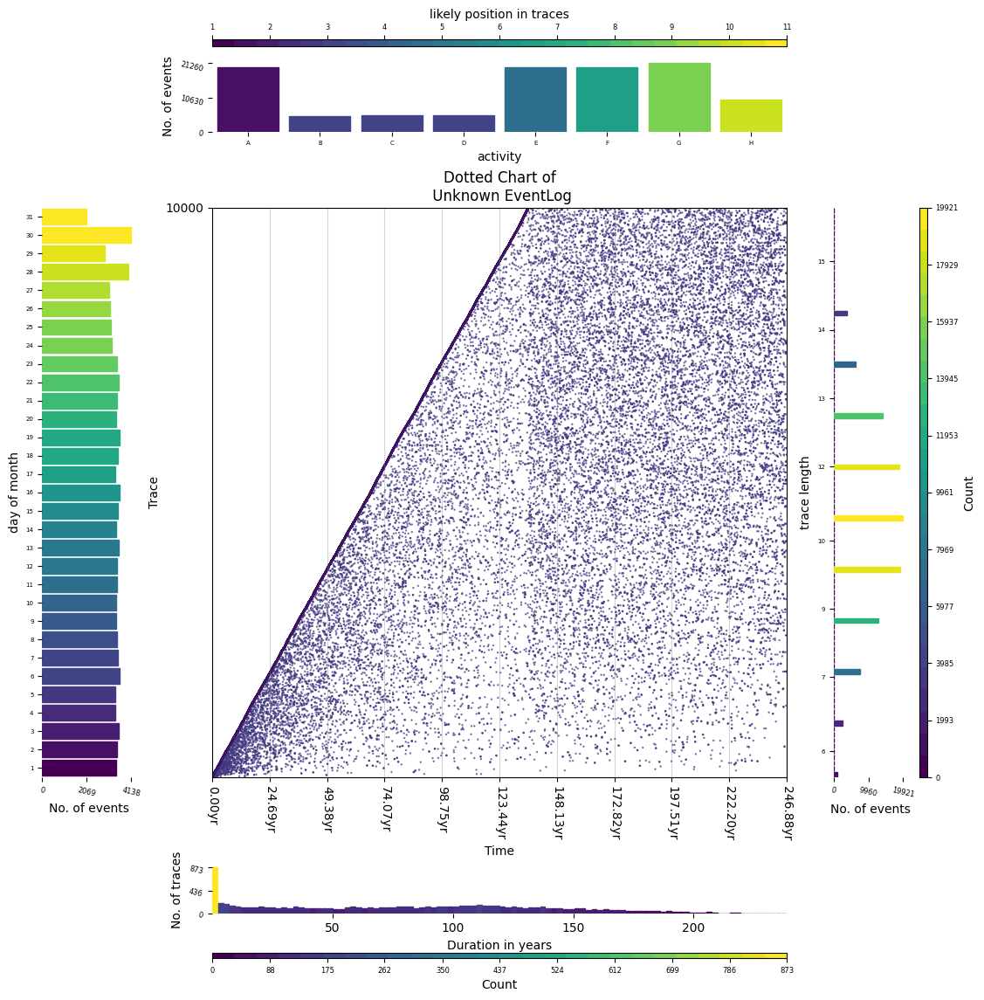

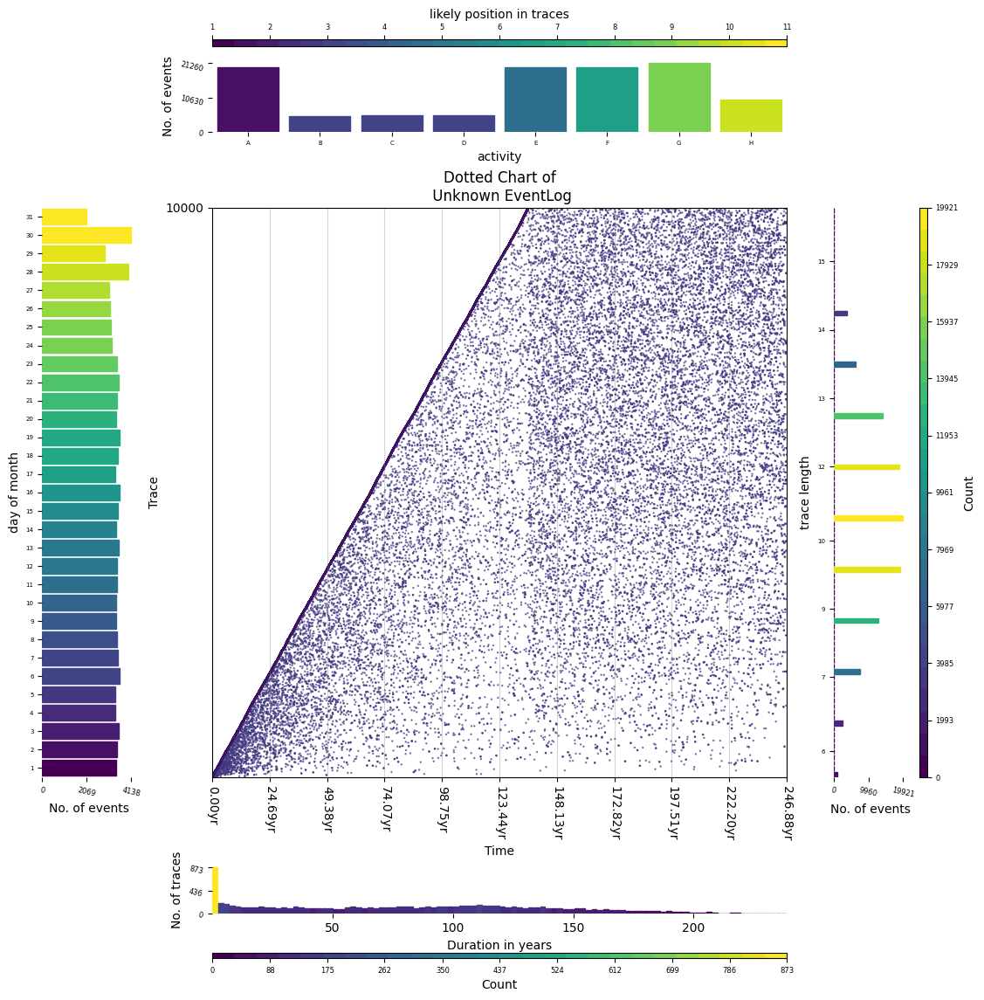

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(cp_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()

# Help Desk CPM

In [6]:
df_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/cleaned_HelpDesk_log.xes')
reviewlog = pm4py.convert_to_event_log(df_log)

parsing log, completed traces ::   0%|          | 0/4580 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [7]:
import datetime

# Create a pivot table of the start (minimum) and end (maximum) timestamps associated with each case:
case_starts_ends = df_log.pivot_table(index='case:concept:name', aggfunc={'time:timestamp': ['min', 'max']}) 
case_starts_ends = case_starts_ends.reset_index() 
case_starts_ends.columns = ['case:concept:name', 'caseend', 'casestart'] 
# Merge with the main event log data so that for each row we have the start and end times.
df_log = df_log.merge(case_starts_ends, on='case:concept:name') 
# Calculate the relative time by subtracting the process start time from the event timestamp
df_log['relativetime'] = df_log['time:timestamp'] - df_log['casestart']
# Convert relative times to more friendly measures
## seconds
df_log['relativetime_s'] = df_log['relativetime'].dt.seconds + 86400*df_log['relativetime'].dt.days 
## days
df_log['relativedays'] = df_log['relativetime'].dt.days

In [8]:
df_log

,concept:name,lifecycle:transition,org:resource,time:timestamp,Activity,Resource,name,case:concept:name,case:variant,case:variant-index,case:creator,caseend,casestart,relativetime,relativetime_s,relativedays
0,Assign seriousness,complete,Kelly Williams,2012-10-09 11:50:17+00:00,Assign seriousness,Value 1,Kelly Williams,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,0 days 00:00:00,0,0
1,Take in charge ticket,complete,Angelica Smith,2012-10-09 11:51:01+00:00,Take in charge ticket,Value 1,Angelica Smith,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,0 days 00:00:44,44,0
2,Take in charge ticket,complete,James Rogers,2012-10-12 12:02:56+00:00,Take in charge ticket,Value 2,James Rogers,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,3 days 00:12:39,259959,3
3,Resolve ticket,complete,Martin Burton,2012-10-25 08:54:26+00:00,Resolve ticket,Value 1,Martin Burton,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,15 days 21:04:09,1371849,15
4,Closed,complete,James Rogers,2012-11-09 10:54:39+00:00,Closed,Value 3,James Rogers,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,30 days 23:04:22,2675062,30
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21343,Closed,complete,Wendy Thompson,2010-09-02 07:11:00+00:00,Closed,Value 5,Wendy Thompson,Case4579,Variant 1,1,Fluxicon Disco,2010-09-02 07:11:00+00:00,2010-07-26 07:02:35+00:00,38 days 00:08:25,3283705,38
21344,Take in charge ticket,complete,Jennifer Young,2012-01-03 07:33:43+00:00,Take in charge ticket,Value 6,Jennifer Young,Case4580,Variant 18,18,Fluxicon Disco,2012-02-08 15:00:34+00:00,2012-01-03 07:33:43+00:00,0 days 00:00:00,0,0
21345,Wait,complete,Mark Valencia,2012-01-10 13:30:11+00:00,Wait,Value 6,Mark Valencia,Case4580,Variant 18,18,Fluxicon Disco,2012-02-08 15:00:34+00:00,2012-01-03 07:33:43+00:00,7 days 05:56:28,626188,7
21346,Resolve ticket,complete,Angelica Smith,2012-01-10 15:07:40+00:00,Resolve ticket,Value 6,Angelica Smith,Case4580,Variant 18,18,Fluxicon Disco,2012-02-08 15:00:34+00:00,2012-01-03 07:33:43+00:00,7 days 07:33:57,632037,7


In [ ]:
aggregation = df_log.groupby(by=["concept:name"]).agg({'relativedays' : ['min', 'max']})
aggregation

relativedays    
                               min max
concept:name                          
Assign seriousness               0  44
Closed                          15  59
Create SW anomaly                0  55
DUPLICATE                        7   7
INVALID                         13  34
Insert ticket                    0   0
RESOLVED                        13  34
Require upgrade                  0  55
Resolve SW anomaly               0  37
Resolve ticket                   0  58
Schedule intervention            0  11
Take in charge ticket            0  48
VERIFIED                         7  56
Wait                             0  48

In [ ]:
#aggregation.to_csv('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/CPM File/helpdesk aggregation.csv',index=True, header=True)

Import the excel sheet with the CPM calculated

In [3]:
# Now import the csv of the manually calculated Critical Path
helpdesk_excel = pd.read_excel(r"/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/CPM File/Critical Path Methods.xlsx", sheet_name='HelpDesk CPM')
helpdesk_excel = helpdesk_excel.replace(np.nan, '', regex=True)
helpdesk_excel

,Activity,Dependency,relative_max_days,ES,EF,LS,LF,total_float,free_float
0,Insert ticket,,0.0,0.0,0.0,0.0,0.0,0.0,
1,Assign seriousness,,44.0,0.0,44.0,48.0,92.0,48.0,
2,Take in charge ticket,Assign seriousnes,48.0,44.0,92.0,55.0,103.0,11.0,
3,Schedule intervention,Take in charge ticket,11.0,92.0,103.0,92.0,103.0,0.0,
4,Create SW anomaly,Take in charge ticket,55.0,92.0,147.0,129.0,184.0,37.0,
5,Resolve SW anomaly,Create SW anomaly,37.0,147.0,184.0,147.0,184.0,0.0,
6,Wait,Take in charge ticket,48.0,92.0,140.0,150.0,198.0,58.0,
7,Require upgrade,Take in charge ticket,55.0,92.0,147.0,143.0,198.0,51.0,
8,Resolve ticket,Wait,58.0,140.0,198.0,199.0,257.0,59.0,
9,RESOLVED,Resolved Ticket,34.0,198.0,232.0,198.0,232.0,0.0,


In [ ]:
# function definition
def highlight_cols(s):
   # return 'background-color: % s' % 'red'
   return 'background-color: % s' % 'red'
  
# highlighting the cells
display(helpdesk_excel.style.applymap(highlight_cols, 
                          subset = pd.IndexSlice[helpdesk_excel.total_float ==0, :]))

,Activity,Dependency,relative_max_days,ES,EF,LS,LF,total_float,free_float
0,Insert ticket,,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,
1,Assign seriousness,,44.000000,0.000000,44.000000,48.000000,92.000000,48.000000,
2,Take in charge ticket,Assign seriousnes,48.000000,44.000000,92.000000,55.000000,103.000000,11.000000,
3,Schedule intervention,Take in charge ticket,11.000000,92.000000,103.000000,92.000000,103.000000,0.000000,
4,Create SW anomaly,Take in charge ticket,55.000000,92.000000,147.000000,129.000000,184.000000,37.000000,
5,Resolve SW anomaly,Create SW anomaly,37.000000,147.000000,184.000000,147.000000,184.000000,0.000000,
6,Wait,Take in charge ticket,48.000000,92.000000,140.000000,150.000000,198.000000,58.000000,
7,Require upgrade,Take in charge ticket,55.000000,92.000000,147.000000,143.000000,198.000000,51.000000,
8,Resolve ticket,Wait,58.000000,140.000000,198.000000,199.000000,257.000000,59.000000,
9,RESOLVED,Resolved Ticket,34.000000,198.000000,232.000000,198.000000,232.000000,0.000000,


In [4]:
# the total duration of the event using this method
helpdesk_td = ['total duration']
helpdesk_total_duration = helpdesk_excel.loc[helpdesk_excel.Dependency == 'Total Duration', 'relative_max_days'].iloc[0]
print('The relative day total duration using the Critical Method is {} days'.format(int(helpdesk_total_duration)) )

The relative day total duration using the Critical Method is 257 days


In [9]:
# output a dataframe with only the activites in the cp
helpdesk_rows= ['Insert ticket','Schedule intervention','Resolve SW anomaly','RESOLVED','INVALID','VERIFIED','DUPLICATE', 'Closed']
helpdesk_df =df_log[df_log['concept:name'].isin(helpdesk_rows)]

In [10]:
helpdesk_df

,concept:name,lifecycle:transition,org:resource,time:timestamp,Activity,Resource,name,case:concept:name,case:variant,case:variant-index,case:creator,caseend,casestart,relativetime,relativetime_s,relativedays
4,Closed,complete,James Rogers,2012-11-09 10:54:39+00:00,Closed,Value 3,James Rogers,Case1,Variant 12,12,Fluxicon Disco,2012-11-09 10:54:39+00:00,2012-10-09 11:50:17+00:00,30 days 23:04:22,2675062,30
8,Closed,complete,Ricardo Parker,2012-05-19 06:00:28+00:00,Closed,Value 5,Ricardo Parker,Case2,Variant 1,1,Fluxicon Disco,2012-05-19 06:00:28+00:00,2012-04-03 05:55:38+00:00,46 days 00:04:50,3974690,46
12,Closed,complete,Nicholas Fowler,2010-11-30 09:20:18+00:00,Closed,Value 5,Nicholas Fowler,Case3,Variant 1,1,Fluxicon Disco,2010-11-30 09:20:18+00:00,2010-10-29 07:14:06+00:00,32 days 02:06:12,2772372,32
16,Closed,complete,Martin Burton,2011-02-12 12:40:42+00:00,Closed,Value 5,Martin Burton,Case4,Variant 1,1,Fluxicon Disco,2011-02-12 12:40:42+00:00,2010-12-15 12:31:53+00:00,59 days 00:08:49,5098129,59
22,Closed,complete,Bradley Acosta,2012-05-25 10:10:28+00:00,Closed,Value 5,Bradley Acosta,Case5,Variant 9,9,Fluxicon Disco,2012-05-25 10:10:28+00:00,2012-04-03 10:08:32+00:00,52 days 00:01:56,4492916,52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21332,Closed,complete,Michelle Glenn,2012-03-16 08:30:16+00:00,Closed,Value 5,Michelle Glenn,Case4576,Variant 1,1,Fluxicon Disco,2012-03-16 08:30:16+00:00,2012-02-14 08:21:51+00:00,31 days 00:08:25,2678905,31
21336,Closed,complete,Angelica Smith,2010-05-13 06:30:29+00:00,Closed,Value 5,Angelica Smith,Case4577,Variant 1,1,Fluxicon Disco,2010-05-13 06:30:29+00:00,2010-03-24 13:28:51+00:00,49 days 17:01:38,4294898,49
21339,Closed,complete,Ricardo Parker,2012-01-28 11:30:15+00:00,Closed,Value 5,Ricardo Parker,Case4578,Variant 5,5,Fluxicon Disco,2012-01-28 11:30:15+00:00,2011-12-28 11:21:10+00:00,31 days 00:09:05,2678945,31
21343,Closed,complete,Wendy Thompson,2010-09-02 07:11:00+00:00,Closed,Value 5,Wendy Thompson,Case4579,Variant 1,1,Fluxicon Disco,2010-09-02 07:11:00+00:00,2010-07-26 07:02:35+00:00,38 days 00:08:25,3283705,38


In [11]:
# convert the dataframe to an event log
helpdesk_event_log = pm4py.convert_to_event_log(helpdesk_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


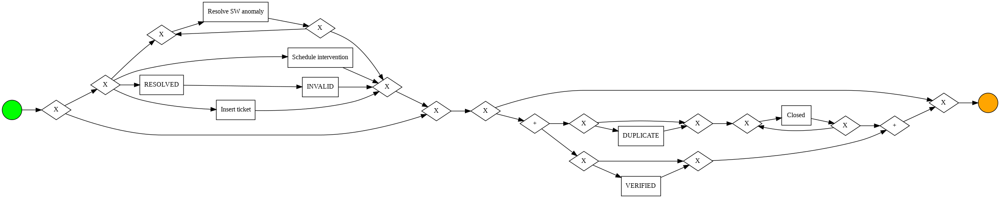

In [12]:
# show the bpmn model
cp_bpmn_model = pm4py.discover_bpmn_inductive(helpdesk_event_log)
pm4py.view_bpmn(cp_bpmn_model)

<ipython-input-169-ffb2c5844882>:2: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(helpdesk_event_log)


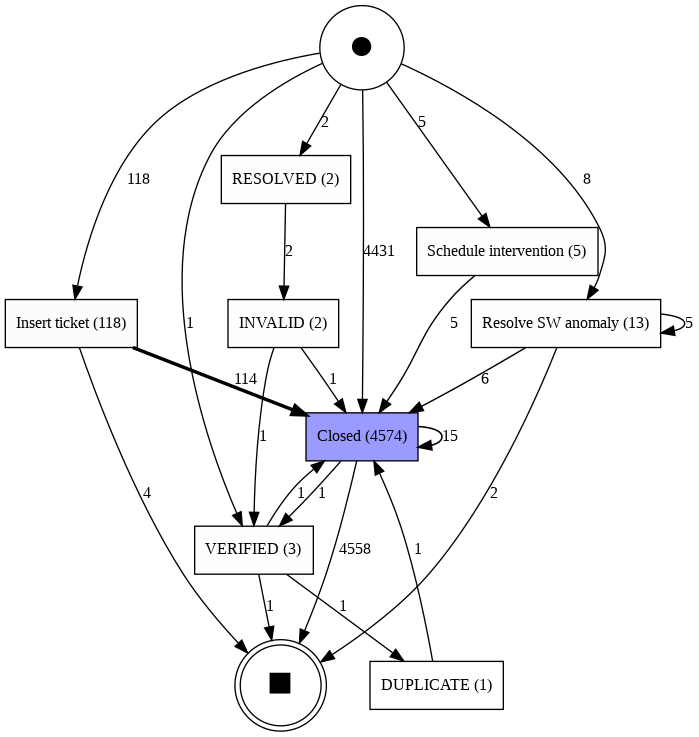

In [ ]:
#show the dfg model
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(helpdesk_event_log)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

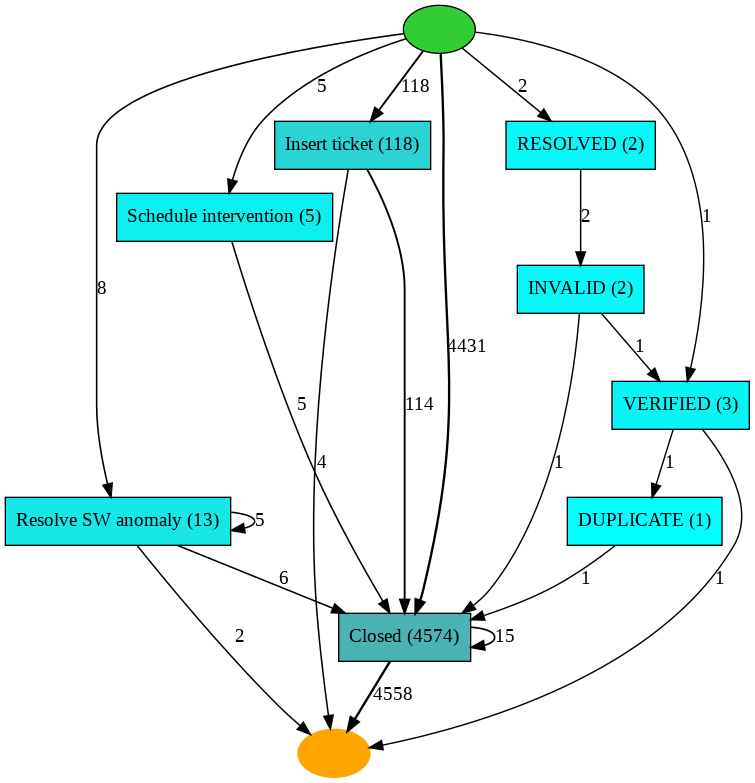

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(helpdesk_event_log)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
helpdesk_num_event = len(helpdesk_df)
helpdesk_num_cases = len(helpdesk_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(helpdesk_num_event, helpdesk_num_cases))
helpdesk_ppl_invovled = helpdesk_df['org:resource'].unique()
helpdesk_num_ppl_invovled = len(helpdesk_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(helpdesk_ppl_invovled, helpdesk_num_ppl_invovled))

number of event: 4718 
 Number of unique cases: 4565
The resources or people invovled are: ['James Rogers' 'Ricardo Parker' 'Nicholas Fowler' 'Martin Burton'
 'Bradley Acosta' 'Kristin Burton' 'Wendy Thompson' 'Angelica Smith'
 'James Cole' 'Jennifer Young' 'Kelly Williams' 'Alex Haley' 'Megan Ortiz'
 'Michelle Glenn' 'Angela Kirk' 'Donna Pearson' 'Richard Perry'
 'Linda Brooks' 'John Nichols' 'Omar Collins' 'Olivia Henry'
 'Mark Valencia'] 
 The number of resources are: 22


### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

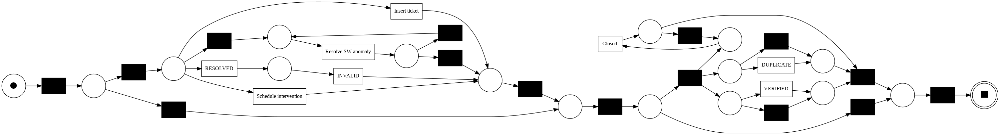

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


/usr/local/lib/python3.8/dist-packages/pm4py/util/lp/variants/scipy_solver.py:26: OptimizeWarning: A_eq does not appear to be of full row rank. To improve performance, check the problem formulation for redundant equality constraints.
  sol = linprog(c, A_ub=Aub, b_ub=bub, A_eq=Aeq, b_eq=beq, method="revised simplex")


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'percFitTraces': 0.0,
 'averageFitness': 0.23027849939968123,
 'percentage_of_fitting_traces': 0.0,
 'average_trace_fitness': 0.23027849939968123,
 'log_fitness': 0.2209157721042665}

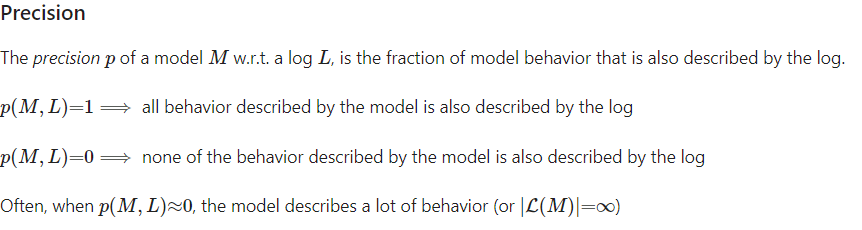

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/500 [00:00<?, ?it/s]

0.11839017122798423

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/500 [00:00<?, ?it/s]

0.14129697044486955

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

{'alignment': [('Assign seriousness', '>>'),
  ('Take in charge ticket', '>>'),
  ('Take in charge ticket', '>>'),
  ('Resolve ticket', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('Closed', 'Closed'),
  ('>>', None),
  ('>>', None)],
 'cost': 40008,
 'visited_states': 35,
 'queued_states': 64,
 'traversed_arcs': 83,
 'lp_solved': 11,
 'fitness': 0.19999999999999996,
 'bwc': 50005}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/226 [00:00<?, ?it/s]

0.7501868342838665

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.6666666666666666

### Statistics

In [13]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(helpdesk_event_log)
simple_ga_descritpion

{'Case1': {'startTime': 1352458479.0,
  'endTime': 1352458479.0,
  'caseDuration': 0.0},
 'Case10': {'startTime': 1270270058.0,
  'endTime': 1270270058.0,
  'caseDuration': 0.0},
 'Case100': {'startTime': 1369909280.0,
  'endTime': 1369909280.0,
  'caseDuration': 0.0},
 'Case1000': {'startTime': 1267858857.0,
  'endTime': 1267858857.0,
  'caseDuration': 0.0},
 'Case1001': {'startTime': 1365748296.0,
  'endTime': 1365748296.0,
  'caseDuration': 0.0},
 'Case1002': {'startTime': 1285400432.0,
  'endTime': 1285400432.0,
  'caseDuration': 0.0},
 'Case1003': {'startTime': 1296809960.0,
  'endTime': 1296809960.0,
  'caseDuration': 0.0},
 'Case1004': {'startTime': 1319256649.0,
  'endTime': 1319256649.0,
  'caseDuration': 0.0},
 'Case1005': {'startTime': 1298011243.0,
  'endTime': 1298011243.0,
  'caseDuration': 0.0},
 'Case1006': {'startTime': 1268298633.0,
  'endTime': 1268298633.0,
  'caseDuration': 0.0},
 'Case1007': {'startTime': 1353998248.0,
  'endTime': 1353998248.0,
  'caseDuration': 

In [14]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("helpdesk cpm case description.xlsx") 

In [15]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(helpdesk_event_log)
simple_ga_case_duration

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [16]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('cpm helpdesk all_case_durationn.xlsx')

In [17]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(helpdesk_event_log)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  0.0 second
Median case duration in days:  0.0 days


### SNA

In [ ]:
#social_network_analysis_module.sna.role_discovery(cp_event_log)

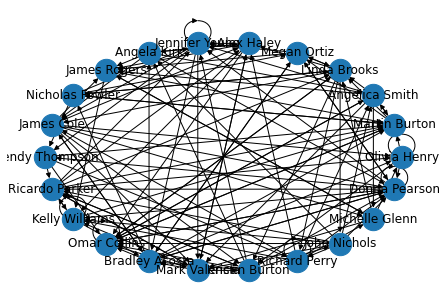

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(helpdesk_event_log)

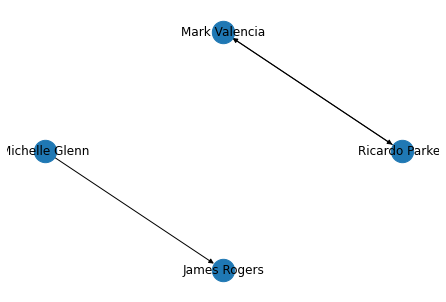

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(helpdesk_event_log)

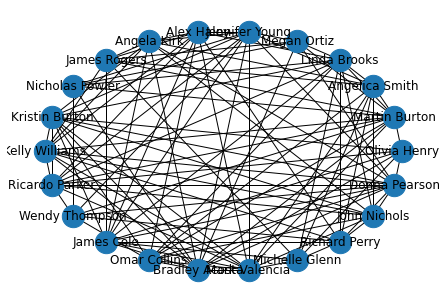

In [ ]:
working_together = social_network_analysis_module.sna.working_together(helpdesk_event_log) 

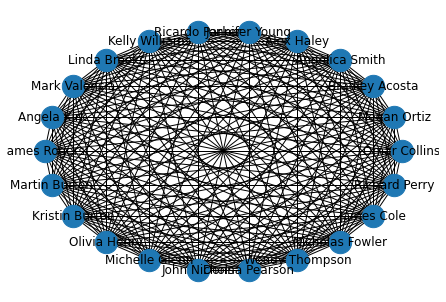

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(helpdesk_event_log) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(helpdesk_event_log) 


group_relative_focus
{'James Rogers': {'Closed': 0.047879317883690424, 'Insert ticket': 0.025423728813559324, 'VERIFIED': 0.0, 'DUPLICATE': 0.0, 'Resolve SW anomaly': 0.07692307692307693, 'Schedule intervention': 0.0, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'Ricardo Parker': {'Closed': 0.045693047660690864, 'Insert ticket': 0.0423728813559322, 'VERIFIED': 0.3333333333333333, 'DUPLICATE': 0.0, 'Resolve SW anomaly': 0.07692307692307693, 'Schedule intervention': 0.2, 'RESOLVED': 0.0, 'INVALID': 0.5}, 'Nicholas Fowler': {'Closed': 0.05115872321818977, 'Insert ticket': 0.03389830508474576, 'VERIFIED': 0.0, 'DUPLICATE': 0.0, 'Resolve SW anomaly': 0.0, 'Schedule intervention': 0.2, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'Martin Burton': {'Closed': 0.04241364232619152, 'Insert ticket': 0.0423728813559322, 'VERIFIED': 0.3333333333333333, 'DUPLICATE': 0.0, 'Resolve SW anomaly': 0.07692307692307693, 'Schedule intervention': 0.0, 'RESOLVED': 0.0, 'INVALID': 0.0}, 'Bradley Acosta': {'Closed': 0.0454744206383

In [ ]:
clustering = social_network_analysis_module.sna.clustering(helpdesk_event_log) 

clustered similar activities metric: {'1': ['Michelle Glenn', 'Ricardo Parker', 'Nicholas Fowler', 'Olivia Henry', 'Jennifer Young', 'James Rogers', 'Alex Haley', 'Martin Burton', 'John Nichols', 'Megan Ortiz', 'Mark Valencia', 'Kelly Williams', 'Angela Kirk'], '0': ['Wendy Thompson', 'Angelica Smith', 'Richard Perry', 'Donna Pearson', 'James Cole', 'Linda Brooks', 'Kristin Burton', 'Omar Collins', 'Bradley Acosta']}
 working together clustered metric: {'3': ['Ricardo Parker', 'Richard Perry', 'Omar Collins'], '0': ['Michelle Glenn', 'Nicholas Fowler', 'Olivia Henry', 'Wendy Thompson', 'James Rogers', 'James Cole', 'Kristin Burton', 'Megan Ortiz', 'Kelly Williams'], '1': ['Jennifer Young', 'Martin Burton', 'Linda Brooks', 'John Nichols', 'Mark Valencia', 'Angela Kirk'], '2': ['Angelica Smith', 'Alex Haley'], '4': ['Donna Pearson'], '5': ['Bradley Acosta']}


### EDA

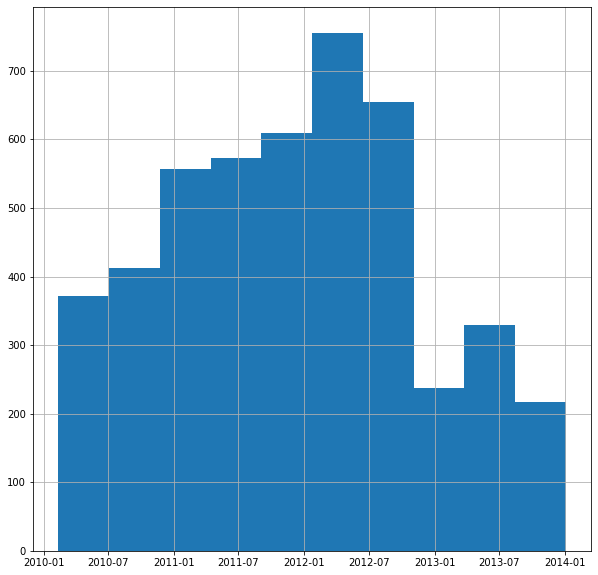

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
helpdesk_df['time:timestamp'].hist()

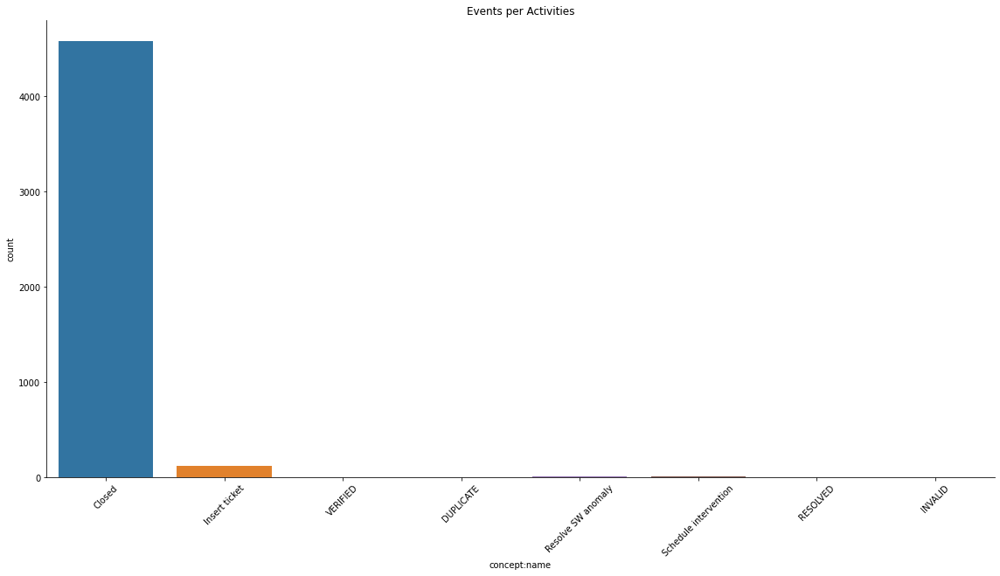

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=helpdesk_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Events per Activities')
plt.show(fig)

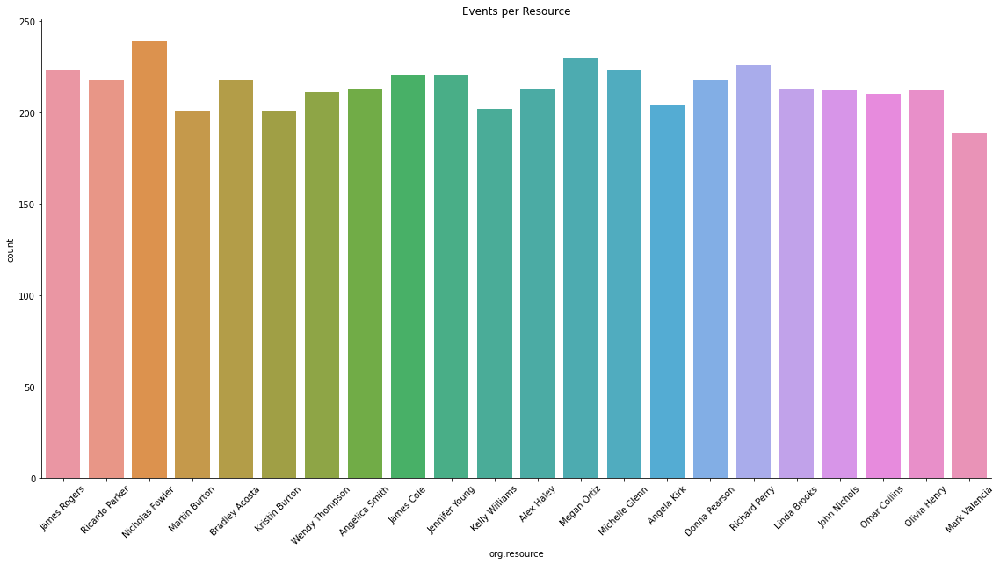

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=helpdesk_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Events per Resource')
plt.show(fig)

In [ ]:
activities = pm4py.get_event_attribute_values(helpdesk_df, "concept:name")
resources = pm4py.get_event_attribute_values(helpdesk_df, "org:resource")

In [ ]:
activities

{'Closed': 4574,
 'Insert ticket': 118,
 'Resolve SW anomaly': 13,
 'Schedule intervention': 5,
 'VERIFIED': 3,
 'RESOLVED': 2,
 'INVALID': 2,
 'DUPLICATE': 1}

In [ ]:
resources

{'Nicholas Fowler': 239,
 'Megan Ortiz': 230,
 'Richard Perry': 226,
 'James Rogers': 223,
 'Michelle Glenn': 223,
 'James Cole': 221,
 'Jennifer Young': 221,
 'Ricardo Parker': 218,
 'Bradley Acosta': 218,
 'Donna Pearson': 218,
 'Linda Brooks': 213,
 'Alex Haley': 213,
 'Angelica Smith': 213,
 'John Nichols': 212,
 'Olivia Henry': 212,
 'Wendy Thompson': 211,
 'Omar Collins': 210,
 'Angela Kirk': 204,
 'Kelly Williams': 202,
 'Kristin Burton': 201,
 'Martin Burton': 201,
 'Mark Valencia': 189}

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


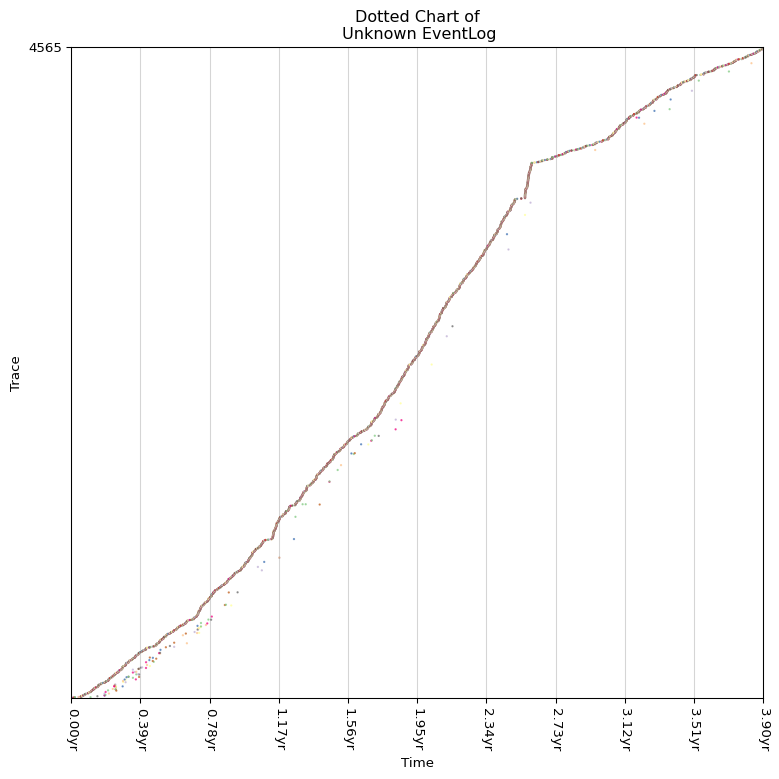

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(helpdesk_event_log)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


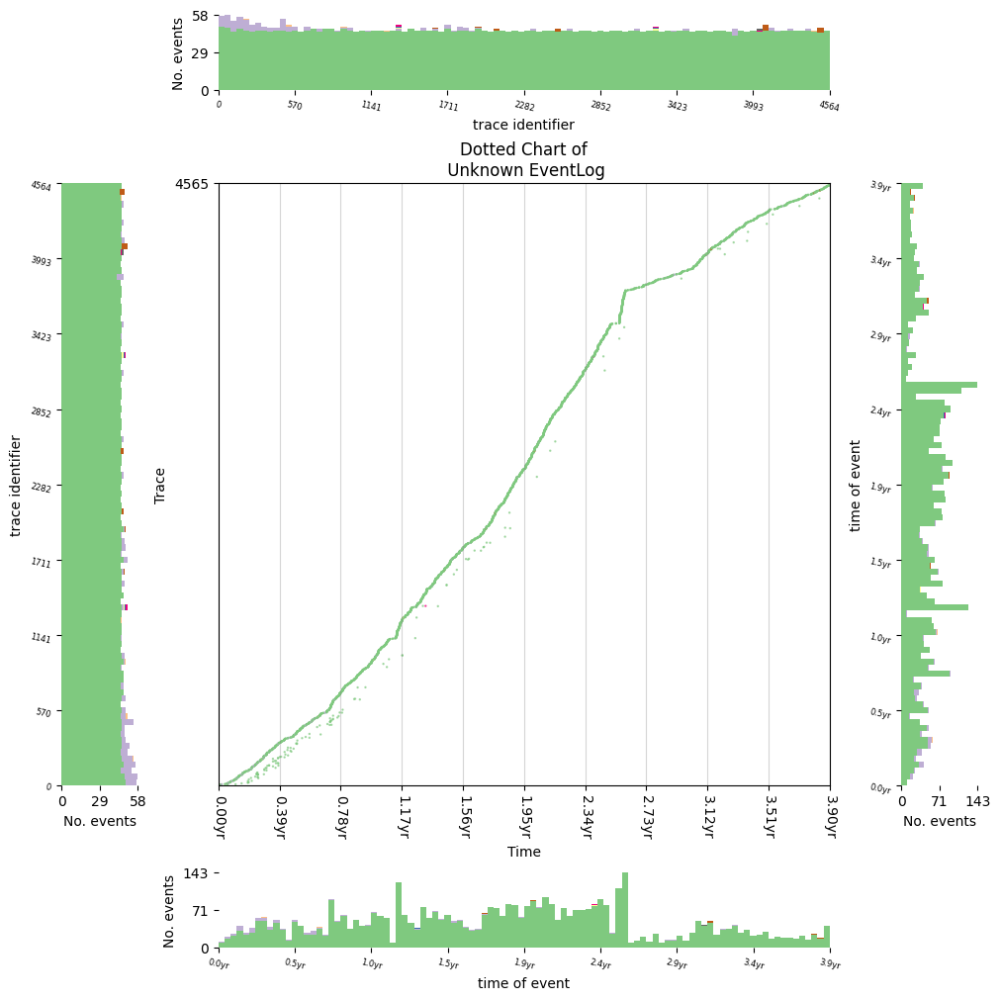

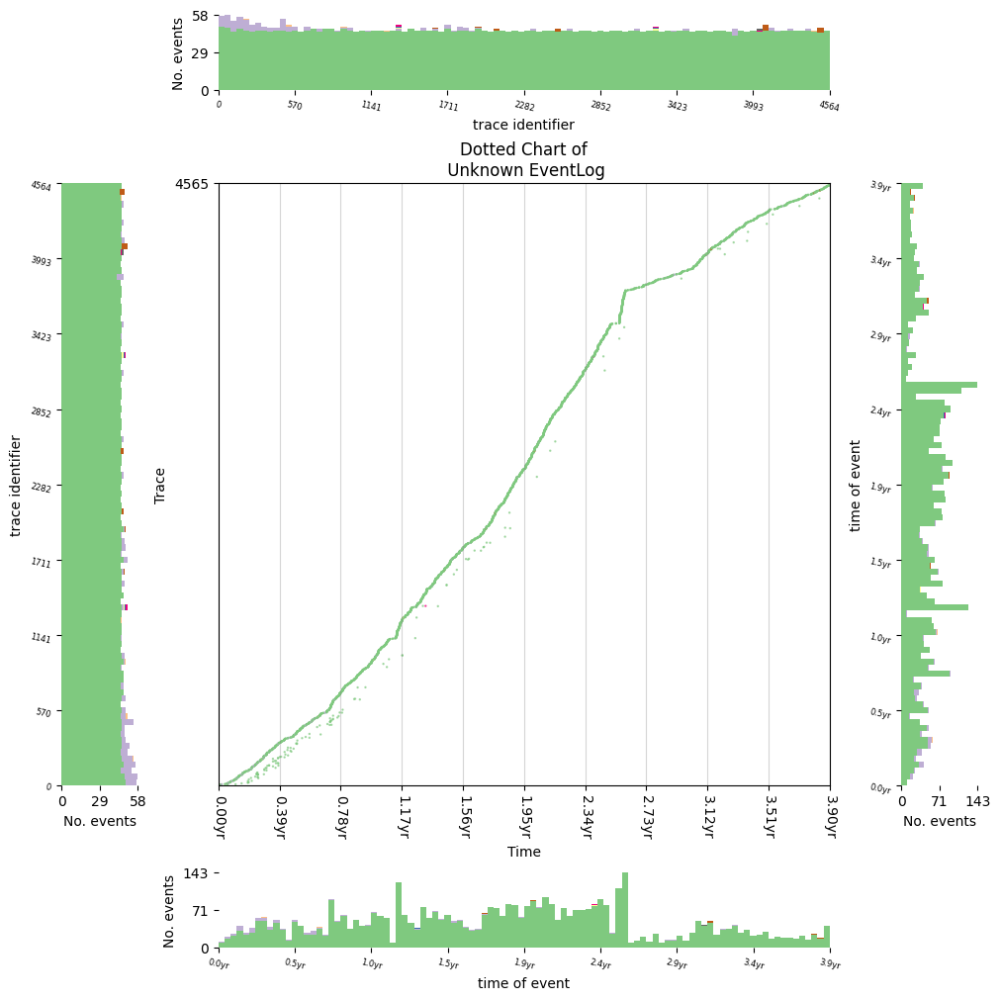

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(helpdesk_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'RESOLVED': 'A', 'Schedule intervention': 'B', 'Insert ticket': 'C', 'Closed': 'D', 'Resolve SW anomaly': 'E', 'DUPLICATE': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'

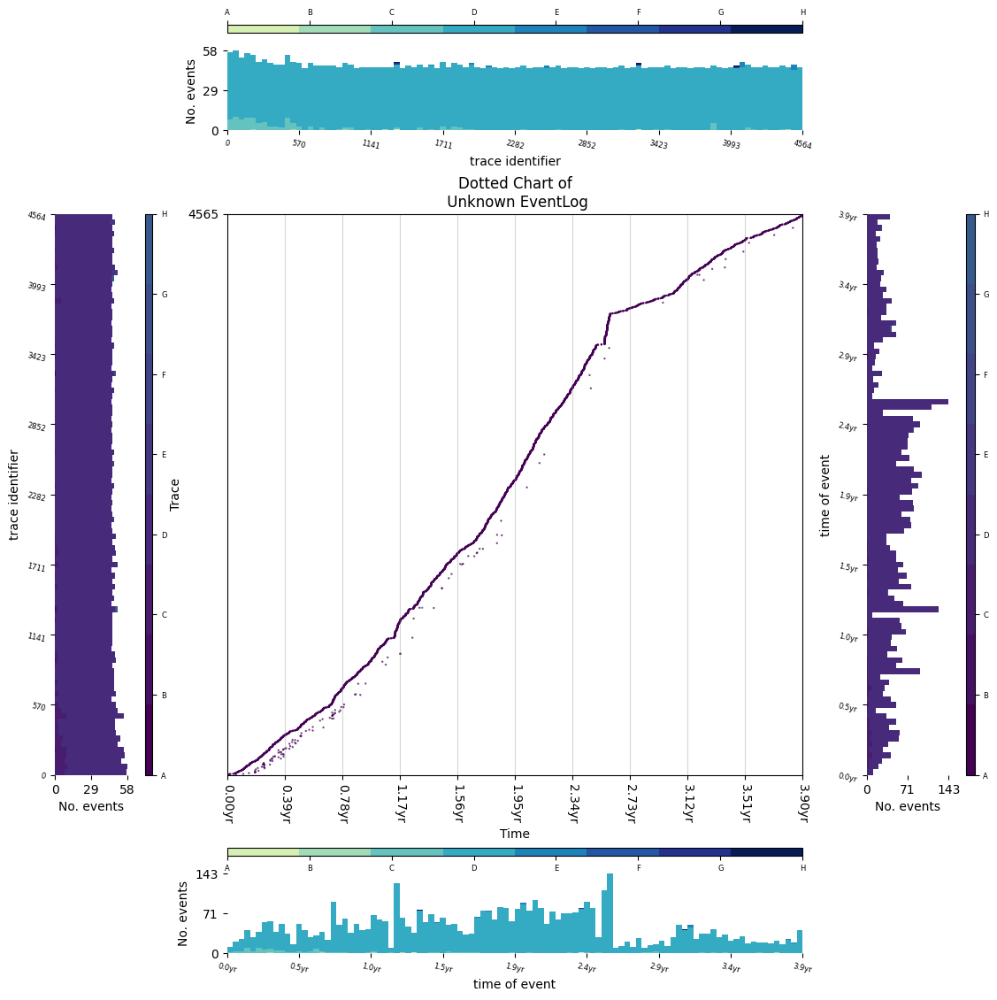

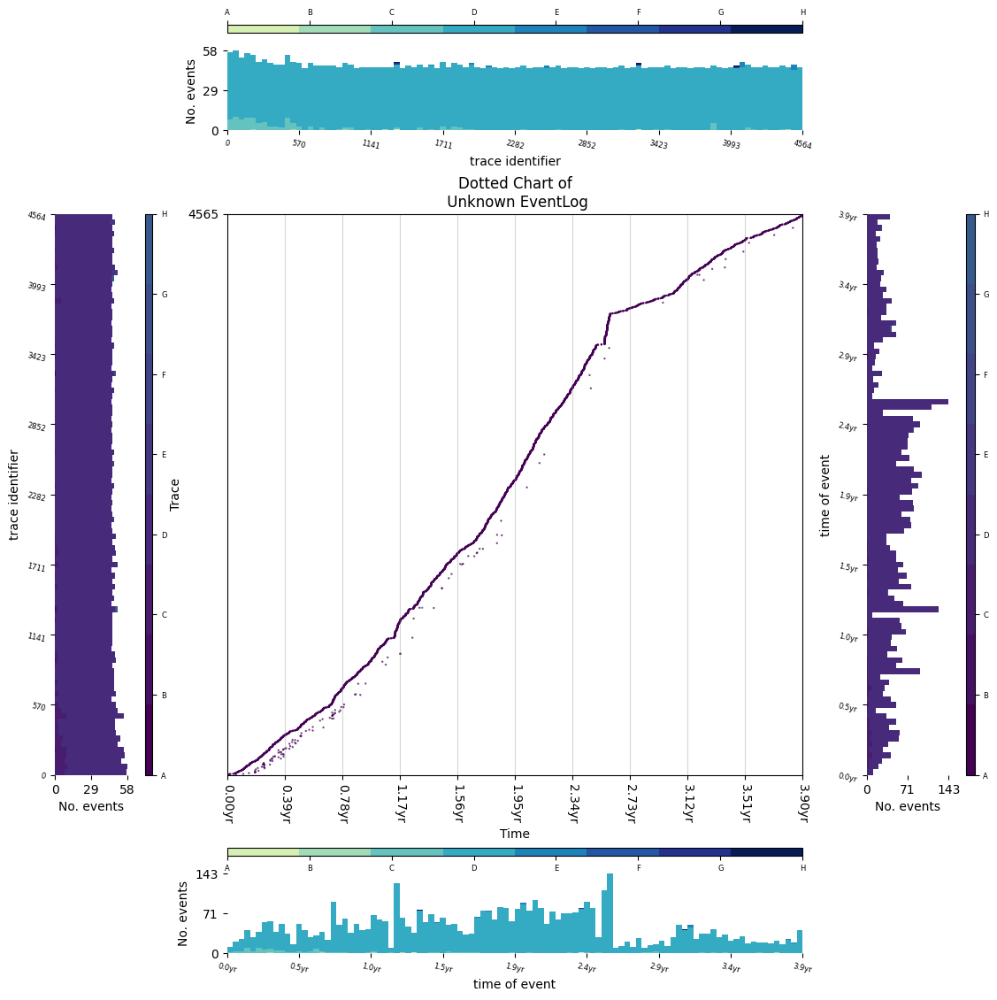

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(helpdesk_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'RESOLVED': 'A', 'Schedule intervention': 'B', 'Insert ticket': 'C', 'Closed': 'D', 'Resolve SW anomaly': 'E', 'DUPLICATE': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'

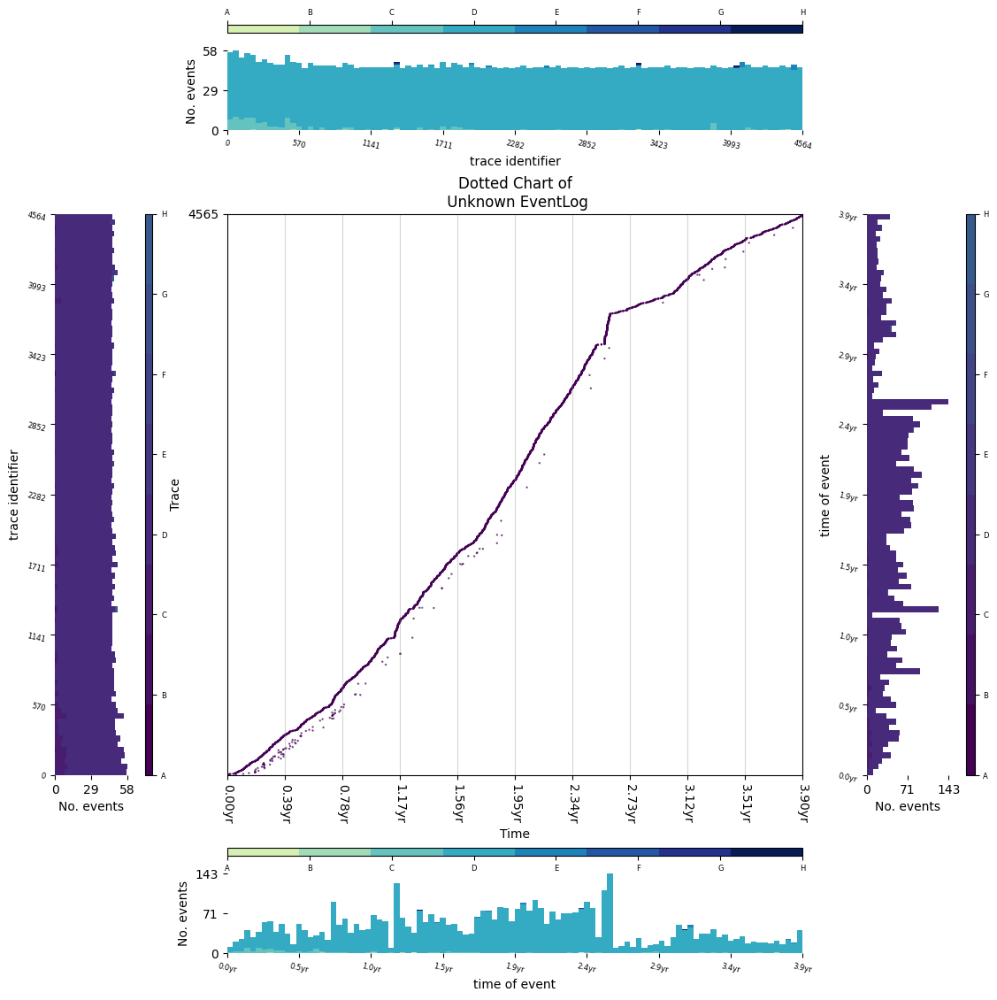

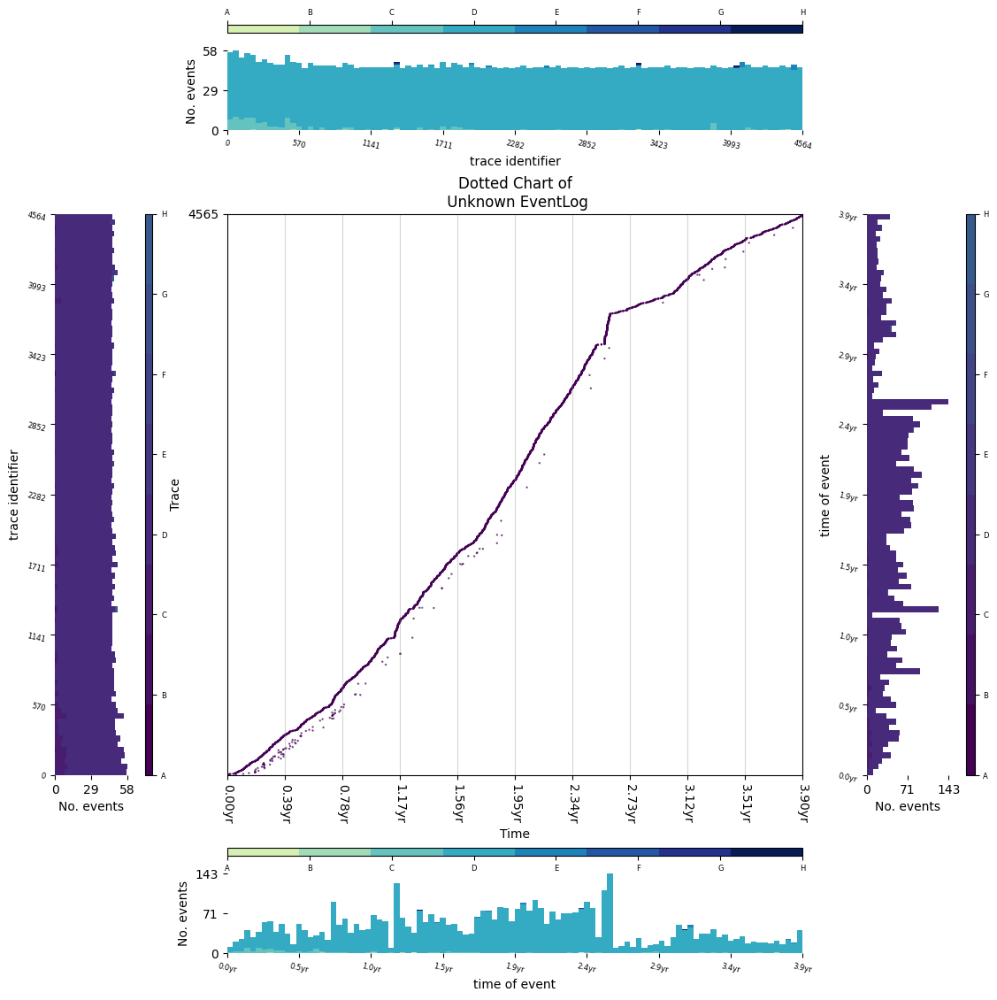

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(helpdesk_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'RESOLVED': 'A', 'Schedule intervention': 'B', 'Insert ticket': 'C', 'Closed': 'D', 'Resolve SW anomaly': 'E', 'DUPLICATE': 'F', 'INVALID': 'G', 'VERIFIED': 'H'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHisto

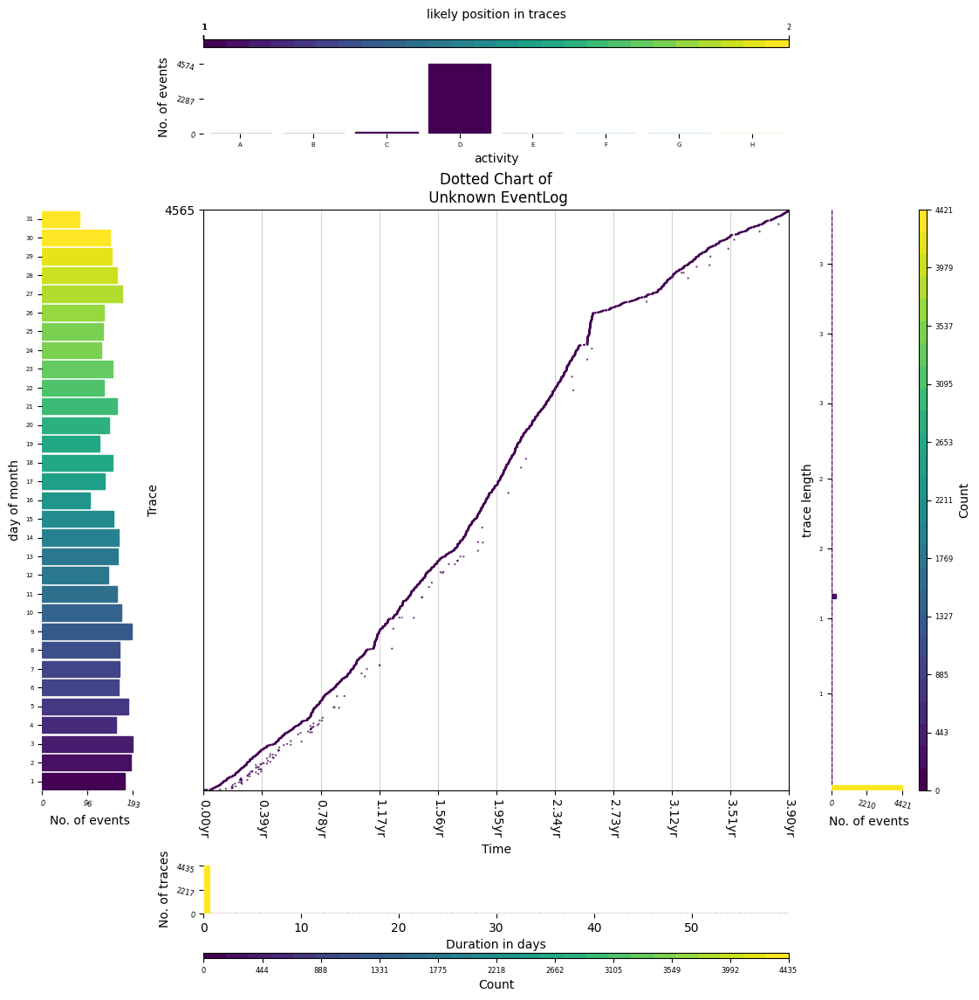

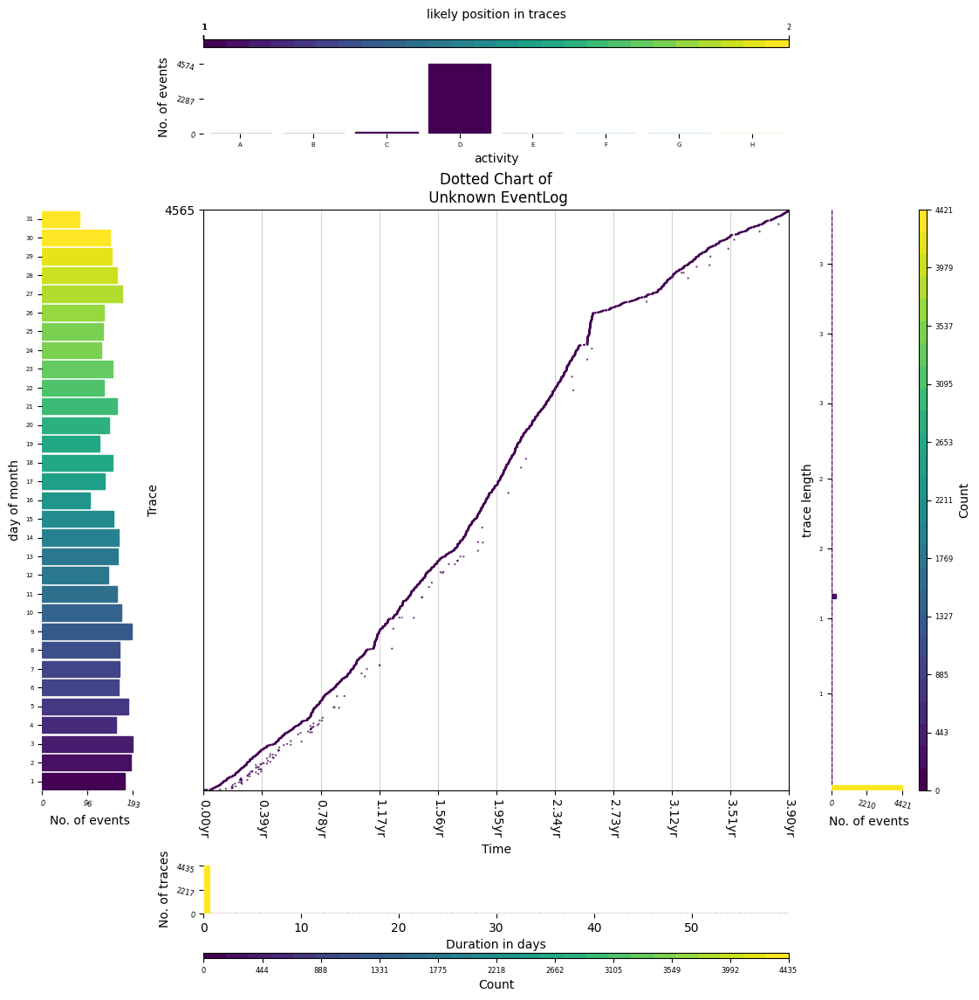

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(helpdesk_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()

# BPI 2012

In [18]:
df_log = pm4py.read_xes('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/cleaned_bpi2012_log.xes')
reviewlog = pm4py.convert_to_event_log(df_log)

parsing log, completed traces ::   0%|          | 0/9658 [00:00<?, ?it/s]

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


In [19]:
import datetime

# Create a pivot table of the start (minimum) and end (maximum) timestamps associated with each case:
case_starts_ends = df_log.pivot_table(index='case:concept:name', aggfunc={'time:timestamp': ['min', 'max']}) 
case_starts_ends = case_starts_ends.reset_index() 
case_starts_ends.columns = ['case:concept:name', 'caseend', 'casestart'] 
# Merge with the main event log data so that for each row we have the start and end times.
df_log = df_log.merge(case_starts_ends, on='case:concept:name') 
# Calculate the relative time by subtracting the process start time from the event timestamp
df_log['relativetime'] = df_log['time:timestamp'] - df_log['casestart']
# Convert relative times to more friendly measures
## seconds
df_log['relativetime_s'] = df_log['relativetime'].dt.seconds + 86400*df_log['relativetime'].dt.days 
## days
df_log['relativedays'] = df_log['relativetime'].dt.days

In [20]:
aggregation = df_log.groupby(by=["concept:name"]).agg({'relativedays' : ['min', 'max']})
aggregation

relativedays    
                                        min max
concept:name                                   
W_Afhandelen leads                        0   4
W_Beoordelen fraude                       0  34
W_Completeren aanvraag                    0  32
W_Nabellen incomplete dossiers            0  84
W_Nabellen offertes                       0  91
W_Valideren aanvraag                      0  85

In [ ]:
#aggregation.to_csv('/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/CPM File/BPI2012 aggregation.csv',index=True, header=True)

Import the excel sheet with the CPM calculated

In [21]:
# Now import the csv of the manually calculated Critical Path
bpi2012_excel = pd.read_excel(r"/content/drive/MyDrive/Abou Keita - Capstone 606/Datasets/CPM File/Critical Path Methods.xlsx", sheet_name='BPI 2012 CPM')
bpi2012_excel = bpi2012_excel.replace(np.nan, '', regex=True)
bpi2012_excel

,Activity,Dependency,relative_max_days,ES,EF,LS,LF,total_float,free_float
0,W_Afhandelen leads,,4.0,0.0,4.0,91.0,95.0,91.0,
1,W_Completeren aanvraag,W_Afhandelen leads,32.0,4.0,36.0,95.0,127.0,91.0,
2,W_Nabellen offertes,W_Completeren aanvraag,91.0,36.0,127.0,121.0,212.0,85.0,
3,W_Valideren aanvraag,W_Nabellen offertes,85.0,127.0,212.0,211.0,296.0,84.0,
4,W_Beoordelen fraude,,34.0,0.0,34.0,0.0,34.0,0.0,
5,W_Nabellen incomplete dossiers,W_Valideren aanvraag,84.0,212.0,296.0,212.0,296.0,0.0,
6,,,,,,,,,
7,,total duration,296.0,,,,,,


In [ ]:
# function definition
def highlight_cols(s):
   # return 'background-color: % s' % 'red'
   return 'background-color: % s' % 'red'
  
# highlighting the cells
display(bpi2012_excel.style.applymap(highlight_cols, 
                          subset = pd.IndexSlice[bpi2012_excel.total_float ==0, :]))

,Activity,Dependency,relative_max_days,ES,EF,LS,LF,total_float,free_float
0,W_Afhandelen leads,,4.000000,0.000000,4.000000,91.000000,95.000000,91.000000,
1,W_Completeren aanvraag,W_Afhandelen leads,32.000000,4.000000,36.000000,95.000000,127.000000,91.000000,
2,W_Nabellen offertes,W_Completeren aanvraag,91.000000,36.000000,127.000000,121.000000,212.000000,85.000000,
3,W_Valideren aanvraag,W_Nabellen offertes,85.000000,127.000000,212.000000,211.000000,296.000000,84.000000,
4,W_Beoordelen fraude,,34.000000,0.000000,34.000000,0.000000,34.000000,0.000000,
5,W_Nabellen incomplete dossiers,W_Valideren aanvraag,84.000000,212.000000,296.000000,212.000000,296.000000,0.000000,
6,,,,,,,,,
7,,total duration,296.000000,,,,,,


In [22]:
# the total duration of the event using this method
bpi2012_td = ['total duration']
bpi2012_total_duration = bpi2012_excel.loc[bpi2012_excel.Dependency == 'total duration', 'relative_max_days'].iloc[0]
print('The relative day total duration using the Critical Method is {} days'.format(int(bpi2012_total_duration)) )

The relative day total duration using the Critical Method is 296 days


## Models representing the Critical Path


In [23]:
# output a dataframe with only the activites in the cp
bpi2012_rows= ['W_Beoordelen fraude','W_Nabellen incomplete dossiers']
bpi2012_df =df_log[df_log['concept:name'].isin(bpi2012_rows)]

In [24]:
bpi2012_df

,lifecycle:transition,time:timestamp,(case)_AMOUNT_REQ,concept:name,org:resource,name,case:concept:name,case:variant,case:variant-index,case:creator,caseend,casestart,relativetime,relativetime_s,relativedays
57,complete,2011-10-13 11:05:42.290000+00:00,15000,W_Nabellen incomplete dossiers,Sarah Hogan,Sarah Hogan,173718,Variant 554,554,Fluxicon Disco,2011-10-27 07:18:01.790000+00:00,2011-10-01 08:44:43.954000+00:00,12 days 02:20:58.336000,1045258,12
58,complete,2011-10-13 11:53:16.314000+00:00,15000,W_Nabellen incomplete dossiers,Nathan Thomas,Nathan Thomas,173718,Variant 554,554,Fluxicon Disco,2011-10-27 07:18:01.790000+00:00,2011-10-01 08:44:43.954000+00:00,12 days 03:08:32.360000,1048112,12
59,complete,2011-10-13 15:12:01.909000+00:00,15000,W_Nabellen incomplete dossiers,Vanessa Shepherd,Vanessa Shepherd,173718,Variant 554,554,Fluxicon Disco,2011-10-27 07:18:01.790000+00:00,2011-10-01 08:44:43.954000+00:00,12 days 06:27:17.955000,1060037,12
60,complete,2011-10-13 15:14:13.926000+00:00,15000,W_Nabellen incomplete dossiers,Emily Rice,Emily Rice,173718,Variant 554,554,Fluxicon Disco,2011-10-27 07:18:01.790000+00:00,2011-10-01 08:44:43.954000+00:00,12 days 06:29:29.972000,1060169,12
61,complete,2011-10-13 15:14:26.112000+00:00,15000,W_Nabellen incomplete dossiers,David Adams,David Adams,173718,Variant 554,554,Fluxicon Disco,2011-10-27 07:18:01.790000+00:00,2011-10-01 08:44:43.954000+00:00,12 days 06:29:42.158000,1060182,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72339,complete,2012-03-12 08:31:00.723000+00:00,17000,W_Nabellen incomplete dossiers,Miguel Reeves,Miguel Reeves,214286,Variant 2263,2263,Fluxicon Disco,2012-03-12 16:25:22.691000+00:00,2012-02-29 19:42:03.681000+00:00,11 days 12:48:57.042000,996537,11
72340,complete,2012-03-12 10:01:27.461000+00:00,17000,W_Nabellen incomplete dossiers,Pam Martinez,Pam Martinez,214286,Variant 2263,2263,Fluxicon Disco,2012-03-12 16:25:22.691000+00:00,2012-02-29 19:42:03.681000+00:00,11 days 14:19:23.780000,1001963,11
72341,complete,2012-03-12 15:19:54.382000+00:00,17000,W_Nabellen incomplete dossiers,Brianna Martinez,Brianna Martinez,214286,Variant 2263,2263,Fluxicon Disco,2012-03-12 16:25:22.691000+00:00,2012-02-29 19:42:03.681000+00:00,11 days 19:37:50.701000,1021070,11
72342,complete,2012-03-12 16:14:05.085000+00:00,17000,W_Nabellen incomplete dossiers,Emily Rice,Emily Rice,214286,Variant 2263,2263,Fluxicon Disco,2012-03-12 16:25:22.691000+00:00,2012-02-29 19:42:03.681000+00:00,11 days 20:32:01.404000,1024321,11


In [25]:
# convert the dataframe to an event log
bpi2012_event_log = pm4py.convert_to_event_log(bpi2012_df)

/usr/local/lib/python3.8/dist-packages/pm4py/utils.py:486: UserWarning: the EventLog class has been deprecated and will be removed in a future release.
  warnings.warn("the EventLog class has been deprecated and will be removed in a future release.")


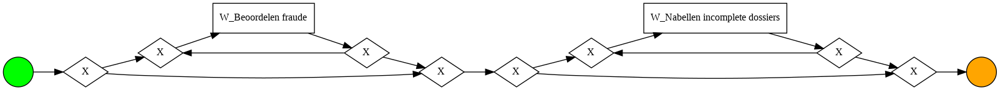

In [ ]:
# show the bpmn model
cp_bpmn_model = pm4py.discover_bpmn_inductive(bpi2012_event_log)
pm4py.view_bpmn(cp_bpmn_model)

<ipython-input-15-d2f8d8cb11f5>:2: DeprecatedWarning: discover_dfg is deprecated as of 2.3.0 and will be removed in 2.4.0. this method will be replaced by the discover_dfg_typed function(). Please adapt your code to use pm4py.discover_dfg_typed()
  cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(bpi2012_event_log)


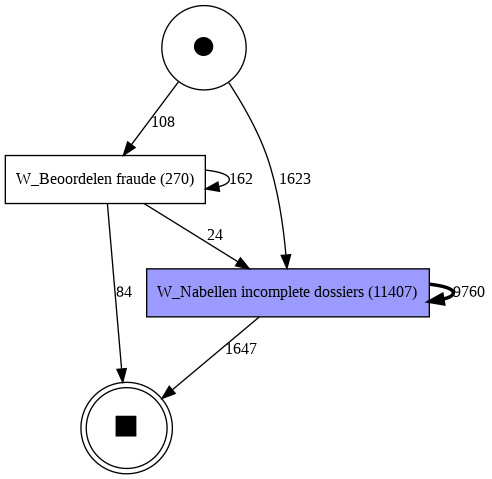

In [ ]:
#show the dfg model
cpdfg, cp_start_activities, cp_end_activities = pm4py.discover_dfg(bpi2012_event_log)
pm4py.view_dfg(cpdfg, cp_start_activities, cp_end_activities)

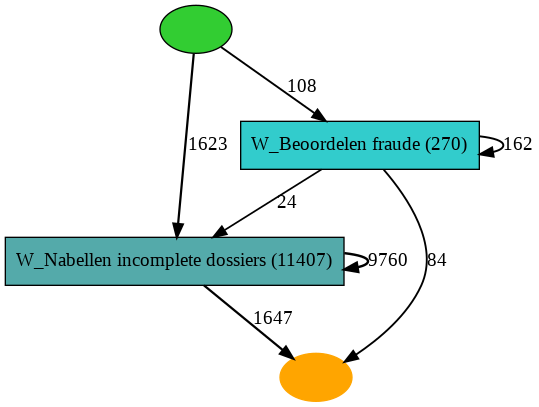

In [ ]:
#show the heuritic miner model
cp_map = pm4py.discover_heuristics_net(bpi2012_event_log)
pm4py.view_heuristics_net(cp_map)

In [ ]:
# number of event in the cpm event log
bpi2012_num_event = len(bpi2012_df)
bpi2012_num_cases = len(bpi2012_df['case:concept:name'].unique())
print("number of event: {} \n Number of unique cases: {}".format(bpi2012_num_event, bpi2012_num_cases))
bpi2012_ppl_invovled = bpi2012_df['org:resource'].unique()
bpi2012_num_ppl_invovled = len(bpi2012_df['org:resource'].unique())
print("The resources or people invovled are: {} \n The number of resources are: {}".format(bpi2012_ppl_invovled, bpi2012_num_ppl_invovled))

number of event: 11677 
 Number of unique cases: 1731
The resources or people invovled are: ['Sarah Hogan' 'Nathan Thomas' 'Vanessa Shepherd' 'Emily Rice'
 'David Adams' 'William Arroyo' 'Mary Thompson' 'Steven Jones'
 'Patricia Lloyd' 'Matthew Walker' 'Austin Jones' 'Kayla Woods'
 'Luis Jackson' 'Michelle Brennan' 'Martha Costa' 'Shawn Barnes'
 'Jennifer Thomas MD' 'Heather Patterson' 'Pam Martinez'
 'Brittany Valencia' 'Christina Barnes' 'Justin Thompson' 'Brianna Bell'
 'Donald White' 'Ashley Daniel' 'Scott Little' 'Sherry Klein'
 'Travis Edwards' 'Michael Anderson MD' 'Kevin Schultz' 'Jennifer Wilson'
 'Brandon Powell' 'Derrick Watts' 'Aaron Ray' 'Patrick Cole'
 'Anna Schroeder' 'Rebecca Guerrero' 'Emily Rojas' 'Laura Morris'
 'Brianna Martinez' 'Jane Turner' 'Robert Peters' 'Donald Wilson'
 'Wesley Mills' 'Joshua Phelps' 'Lisa Henson' 'Rhonda Brady' 'Ruth Davies'
 'Kathy Ingram' 'Jesse Moore' 'David Doyle' 'Paul Alvarado'
 'Nancy Clayton' 'Jacob Wilson' 'Miguel Reeves' 'Jennifer C

### Model Evaluation - Conformance checking

Conformance checking techniques compare a process model with an event log of the same process. The goal is to check if the event log conforms to the model, and, vice versa. Only works with Petri Net models
- https://pm4py.fit.fraunhofer.de/static/assets/api/2.3.0/apihtml#conformance-checking-pm4py-conformance

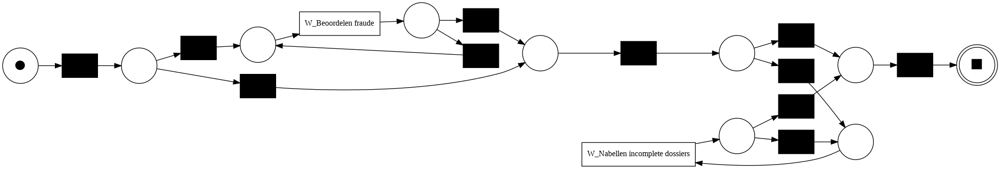

In [ ]:
# conversion to petri net
p_net, pnet_im, pnet_fm = pm4py.convert_to_petri_net(cp_bpmn_model)
pm4py.view_petri_net(p_net, pnet_im, pnet_fm)

Soundness

In [ ]:
#Checking Behavioral Model Properties
pm4py.check_soundness(p_net, pnet_im, pnet_fm)

#from pm4py.algo.analysis.woflan import algorithm as woflan
#is_sound = woflan.apply(p_net, pnet_im, pnet_fm, parameters={woflan.Parameters.RETURN_ASAP_WHEN_NOT_SOUND: False,
#                                                     woflan.Parameters.PRINT_DIAGNOSTICS: True,
#                                                     woflan.Parameters.RETURN_DIAGNOSTICS: False})

Input is ok.
Petri Net is a workflow net.
Every place is covered by s-components.
There are no dead tasks.
All tasks are live.


True

Replay Fitness

The fitness  of an event log  w.r.t. a model  is the fraction of log behavior that is described by the model.

 1 = all behavior described by the event log is also described by the model

 0 = none of the behavior described by the event log is also described by the mode

 - For token-based replay, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated.
 - For alignments, the percentage of traces that are completely fit is returned, along with a fitness value that is calculated as the average of the fitness values of the single traces.

In [ ]:
#token_based_replay compared to orginal log
pm4py.fitness_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'perc_fit_traces': 100.0,
 'average_trace_fitness': 1.0,
 'log_fitness': 1.0,
 'percentage_of_fitting_traces': 100.0}

In [ ]:
#alignments conmpared to original log
alignments_fitness = pm4py.fitness_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments_fitness

aligning log, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'percFitTraces': 0.5280596396769518,
 'averageFitness': 0.06947236227968678,
 'percentage_of_fitting_traces': 0.5280596396769518,
 'average_trace_fitness': 0.06947236227968678,
 'log_fitness': 0.16122869825329889}

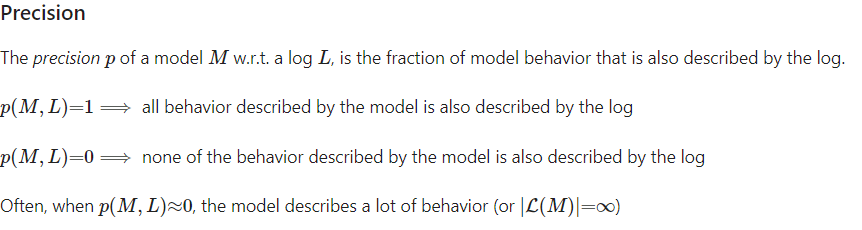

In [ ]:
#token_based_replay compared to orginal log
pm4py.precision_token_based_replay(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/9372 [00:00<?, ?it/s]

0.227334204779859

In [ ]:
#alignments conmpared to original log
pm4py.precision_alignments(reviewlog, p_net, pnet_im, pnet_fm)

computing precision with alignments, completed variants ::   0%|          | 0/9372 [00:00<?, ?it/s]

0.5

Diagnostics

In [ ]:
alignments = pm4py.conformance_diagnostics_alignments(reviewlog, p_net, pnet_im, pnet_fm)
alignments[0]

aligning log, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

{'alignment': [('W_Completeren aanvraag', '>>'),
  ('W_Nabellen offertes', '>>'),
  ('W_Nabellen offertes', '>>'),
  ('W_Nabellen offertes', '>>'),
  ('W_Valideren aanvraag', '>>'),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None),
  ('>>', None)],
 'cost': 50005,
 'visited_states': 10,
 'queued_states': 17,
 'traversed_arcs': 17,
 'lp_solved': 1,
 'fitness': 0.0,
 'bwc': 50005}

Generalization: analyse how the log and the process model match

In [ ]:
from pm4py.algo.evaluation.generalization import algorithm as generalization_evaluator
generalization_evaluator.apply(reviewlog, p_net, pnet_im, pnet_fm)

replaying log with TBR, completed variants ::   0%|          | 0/2263 [00:00<?, ?it/s]

0.965186594267509

Simplicity: the fourth dimension to analyse a process model. In this case, we define simplicity taking into account only the Petri net model. 

In [ ]:
from pm4py.algo.evaluation.simplicity import algorithm as simplicity_evaluator
simplicity_evaluator.apply(p_net)

0.7931034482758622

### Statistics

In [26]:
#case description
simple_ga_descritpion = duration_statistics_module.duration_statistics.cases_description(bpi2012_event_log)
simple_ga_descritpion

{'173718': {'startTime': 1318503942.29,
  'endTime': 1319609558.415,
  'caseDuration': 1105616.125},
 '173721': {'startTime': 1318234804.927,
  'endTime': 1318256909.918,
  'caseDuration': 22104.990999937057},
 '173730': {'startTime': 1319023977.273,
  'endTime': 1319120742.079,
  'caseDuration': 96764.80599999428},
 '173736': {'startTime': 1318496617.264,
  'endTime': 1318926038.657,
  'caseDuration': 429421.3930001259},
 '173739': {'startTime': 1318528907.622,
  'endTime': 1318600158.747,
  'caseDuration': 71251.125},
 '173754': {'startTime': 1318595219.868,
  'endTime': 1318595321.859,
  'caseDuration': 101.9909999370575},
 '173784': {'startTime': 1319028073.137,
  'endTime': 1321000259.143,
  'caseDuration': 1972186.0059998035},
 '173793': {'startTime': 1318928109.733,
  'endTime': 1318928109.733,
  'caseDuration': 0.0},
 '173880': {'startTime': 1319809805.172,
  'endTime': 1320403572.618,
  'caseDuration': 593767.4460000992},
 '173916': {'startTime': 1317632429.974,
  'endTime': 1

In [27]:
# convert the case description to excel format to create a visualization of it
case_description_convert = pd.DataFrame.from_dict(simple_ga_descritpion)
case_description_convert
# convert the case description to excel format to create a visualization of it
case_description_convert.to_excel("cpm BPI2012 case description.xlsx") 

In [28]:
#Gets all the case durations out of the log
simple_ga_case_duration = duration_statistics_module.duration_statistics.all_case_duration(bpi2012_event_log)
simple_ga_case_duration

[0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0,
 0.0

In [29]:
sc = pd.DataFrame (simple_ga_case_duration, columns = ['days cases'])
sc['days cases'] = sc['days cases'] /86400
sc = sc.drop_duplicates()
sc.to_excel('cpm BPI2012 all_case_durationn.xlsx')

In [30]:
simple_ga_median_case_duration = duration_statistics_module.duration_statistics.median_case_duration(bpi2012_event_log)
print("Median case duration in second: ",simple_ga_median_case_duration, "second")
print("Median case duration in days: ",simple_ga_median_case_duration / 86400, "days")

Median case duration in second:  105128.59299993515 second
Median case duration in days:  1.2167661226844346 days


### SNA

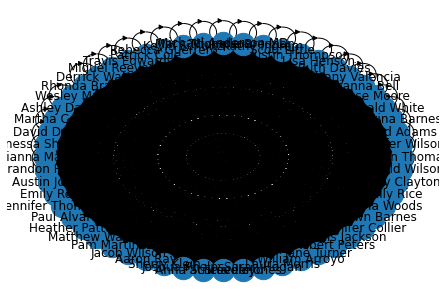

In [ ]:
handover_of_work = social_network_analysis_module.sna.handover_of_work(bpi2012_event_log)

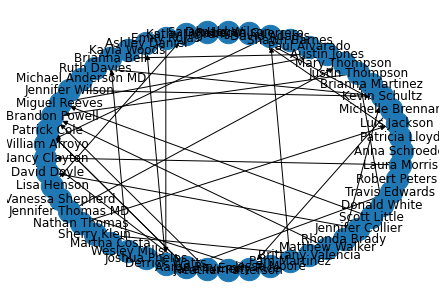

In [ ]:
subcontracting = social_network_analysis_module.sna.subcontracting(bpi2012_event_log)

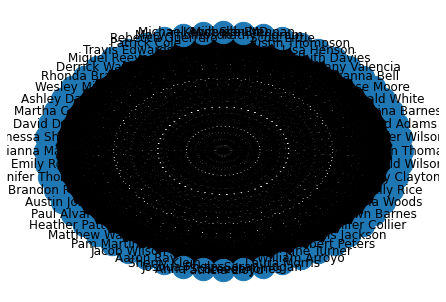

In [ ]:
working_together = social_network_analysis_module.sna.working_together(bpi2012_event_log) 

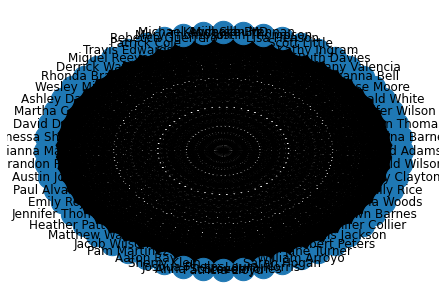

In [ ]:
similar_activities = social_network_analysis_module.sna.similar_activities(bpi2012_event_log) 

In [ ]:
organizational_mining = social_network_analysis_module.sna.organizational_mining(bpi2012_event_log) 


group_relative_focus
{'Sarah Hogan': {'W_Nabellen incomplete dossiers': 0.019900061365828, 'W_Beoordelen fraude': 0.007407407407407408}, 'Nathan Thomas': {'W_Nabellen incomplete dossiers': 0.019461734022968354, 'W_Beoordelen fraude': 0.007407407407407408}, 'Vanessa Shepherd': {'W_Nabellen incomplete dossiers': 0.01814675199438941, 'W_Beoordelen fraude': 0.003703703703703704}, 'Emily Rice': {'W_Nabellen incomplete dossiers': 0.02033838870868765, 'W_Beoordelen fraude': 0.018518518518518517}, 'David Adams': {'W_Nabellen incomplete dossiers': 0.018059086525817482, 'W_Beoordelen fraude': 0.025925925925925925}, 'William Arroyo': {'W_Nabellen incomplete dossiers': 0.015253791531515735, 'W_Beoordelen fraude': 0.025925925925925925}, 'Mary Thompson': {'W_Nabellen incomplete dossiers': 0.01770842465152976, 'W_Beoordelen fraude': 0.018518518518518517}, 'Steven Jones': {'W_Nabellen incomplete dossiers': 0.016919435434382398, 'W_Beoordelen fraude': 0.025925925925925925}, 'Patricia Lloyd': {'W_Nabel

In [ ]:
clustering = social_network_analysis_module.sna.clustering(bpi2012_event_log) 

clustered similar activities metric: {'0': ['Joshua Phelps'], '1': ['Ruth Davies'], '2': ['Brittany Valencia'], '3': ['Kevin Schultz'], '4': ['Scott Little'], '5': ['Sarah Hogan'], '6': ['Jennifer Wilson'], '7': ['Jesse Moore'], '8': ['Emily Rice'], '9': ['Kayla Woods'], '10': ['Aaron Ray'], '11': ['Martha Costa'], '12': ['David Adams'], '13': ['Nathan Thomas'], '14': ['Patrick Cole'], '15': ['Shawn Barnes'], '16': ['Emily Rojas'], '17': ['Pam Martinez'], '18': ['Steven Jones'], '19': ['Luis Jackson'], '20': ['Derrick Watts'], '21': ['Lisa Henson'], '22': ['Jennifer Collier'], '23': ['Rhonda Brady'], '24': ['Ashley Daniel'], '25': ['Jane Turner'], '26': ['Travis Edwards'], '27': ['Jacob Wilson'], '28': ['Anna Schroeder'], '29': ['Brandon Powell'], '30': ['Kathy Ingram'], '31': ['Brianna Bell'], '32': ['Sherry Klein'], '33': ['Donald White'], '34': ['Justin Thompson'], '35': ['Christina Barnes'], '36': ['Brianna Martinez'], '37': ['Paul Alvarado'], '38': ['Laura Morris'], '39': ['Michel

/usr/local/lib/python3.8/dist-packages/sklearn/cluster/_affinity_propagation.py:144: UserWarning: All samples have mutually equal similarities. Returning arbitrary cluster center(s).
  warnings.warn(


### EDA

<AxesSubplot: >

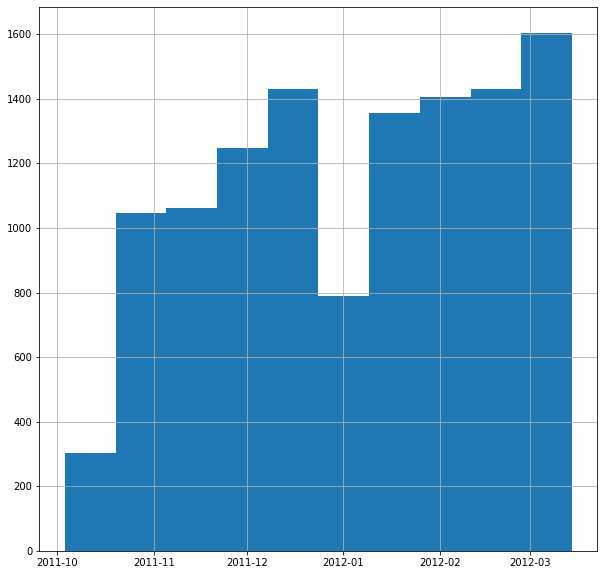

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10,10))
bpi2012_df['time:timestamp'].hist()

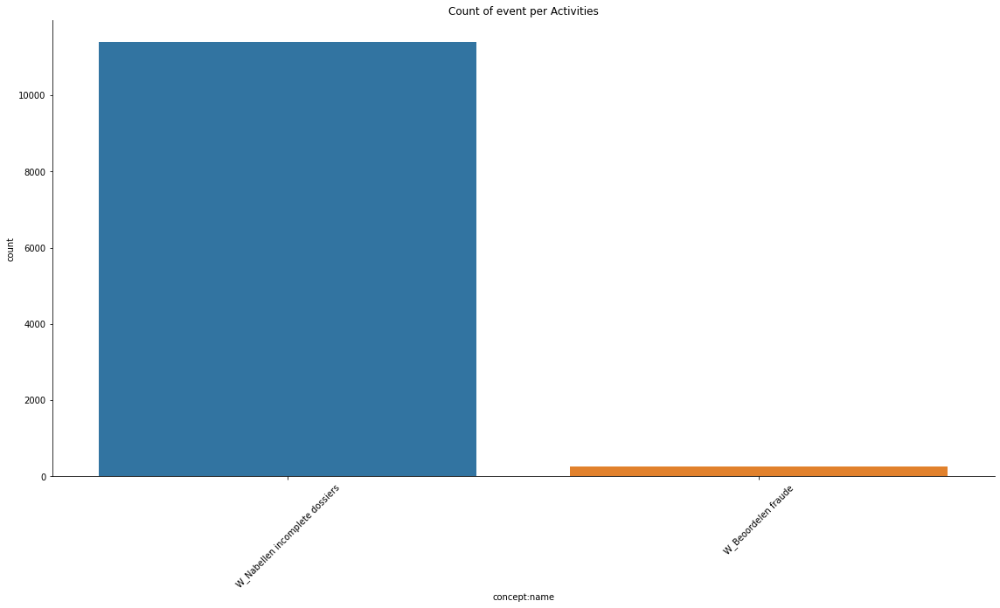

In [ ]:
fig = sns.catplot(x='concept:name', kind='count', data=bpi2012_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Activities')
plt.show(fig)

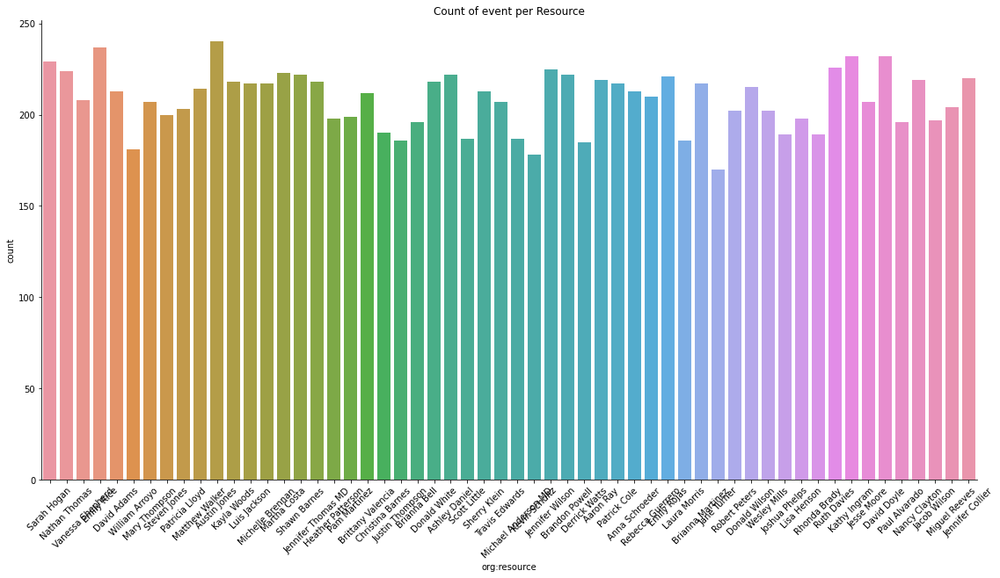

In [ ]:
fig = sns.catplot(x='org:resource', kind='count', data=bpi2012_df, height=8, aspect=2)
plt.xticks(rotation=45)
plt.title('Count of event per Resource')
plt.show(fig)

In [ ]:
activities = pm4py.get_event_attribute_values(bpi2012_df, "concept:name")
resources = pm4py.get_event_attribute_values(bpi2012_df, "org:resource")

In [ ]:
activities

{'W_Nabellen incomplete dossiers': 11407, 'W_Beoordelen fraude': 270}

In [ ]:
resources

{'Austin Jones': 240,
 'Emily Rice': 237,
 'David Doyle': 232,
 'Kathy Ingram': 232,
 'Sarah Hogan': 229,
 'Ruth Davies': 226,
 'Jennifer Wilson': 225,
 'Nathan Thomas': 224,
 'Martha Costa': 223,
 'Brandon Powell': 222,
 'Ashley Daniel': 222,
 'Shawn Barnes': 222,
 'Emily Rojas': 221,
 'Jennifer Collier': 220,
 'Nancy Clayton': 219,
 'Aaron Ray': 219,
 'Jennifer Thomas MD': 218,
 'Donald White': 218,
 'Kayla Woods': 218,
 'Michelle Brennan': 217,
 'Brianna Martinez': 217,
 'Luis Jackson': 217,
 'Patrick Cole': 217,
 'Donald Wilson': 215,
 'Matthew Walker': 214,
 'David Adams': 213,
 'Anna Schroeder': 213,
 'Sherry Klein': 213,
 'Brittany Valencia': 212,
 'Rebecca Guerrero': 210,
 'Vanessa Shepherd': 208,
 'Travis Edwards': 207,
 'Mary Thompson': 207,
 'Jesse Moore': 207,
 'Miguel Reeves': 204,
 'Patricia Lloyd': 203,
 'Wesley Mills': 202,
 'Robert Peters': 202,
 'Steven Jones': 200,
 'Pam Martinez': 199,
 'Heather Patterson': 198,
 'Lisa Henson': 198,
 'Jacob Wilson': 197,
 'Brianna B

### VISPM https://github.com/AdamBanham/vispm

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


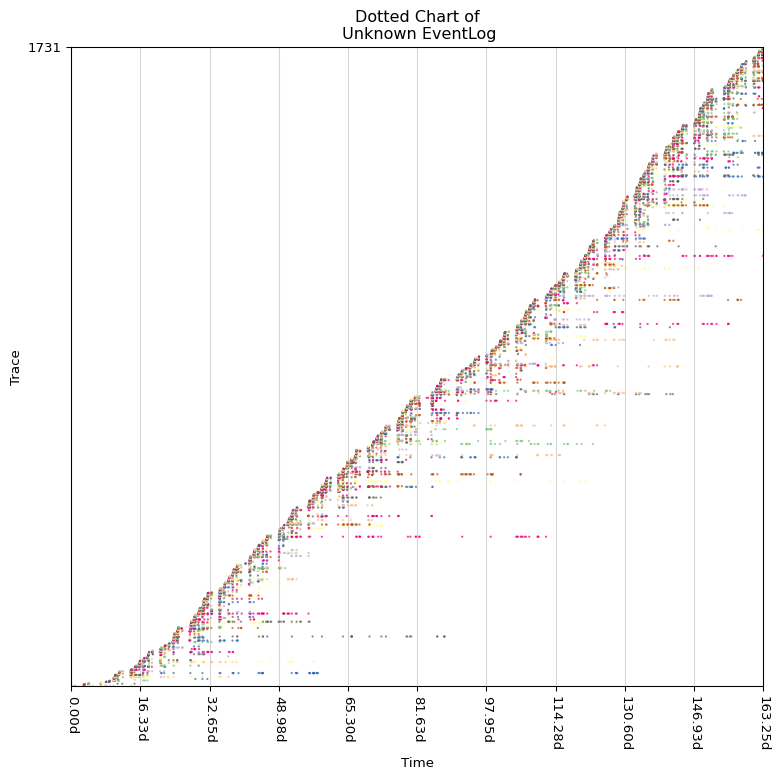

In [ ]:
# Static Presentors
from vispm import StaticDottedChartPresentor
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from matplotlib import pyplot as plt

presentor = StaticDottedChartPresentor(bpi2012_event_log)
presentor.plot()
plt.show()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedColourHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[DottedColourHistogramExtension] ploting histogram... 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDottedChartPresentor] Plot is ready to show... 


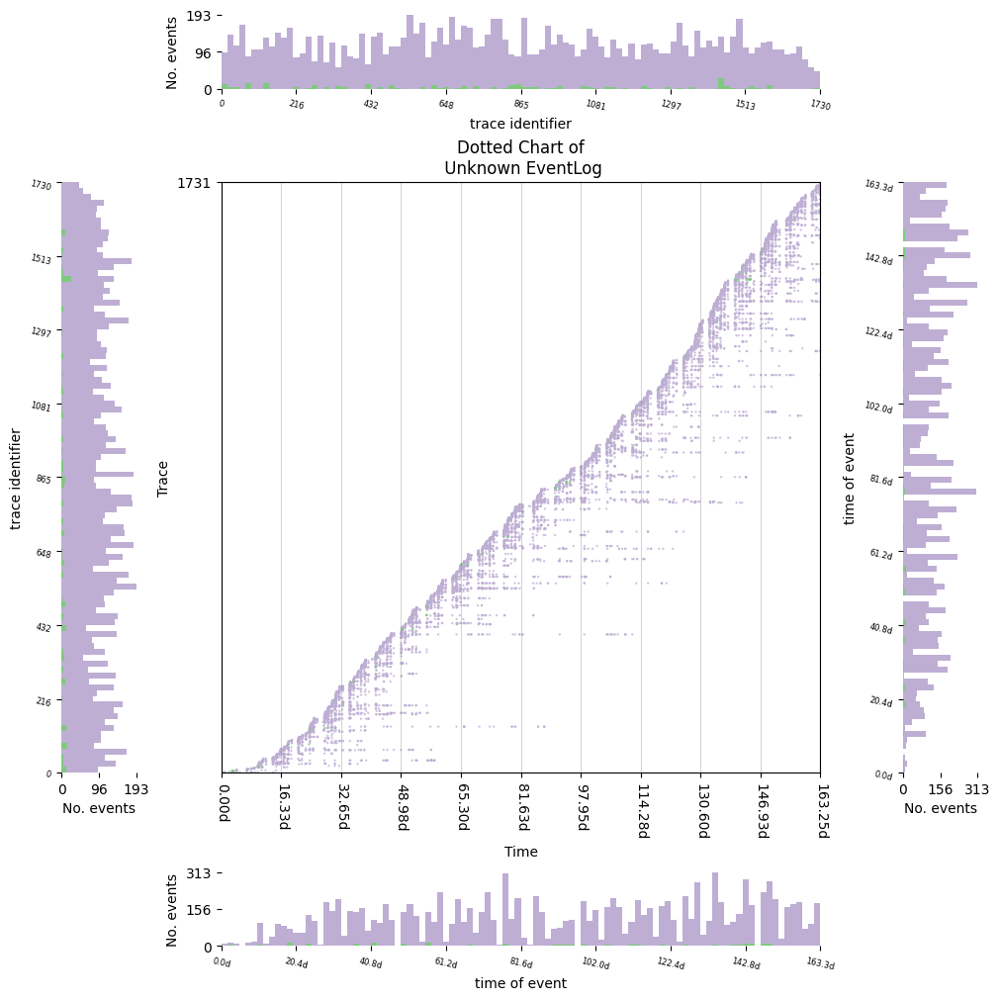

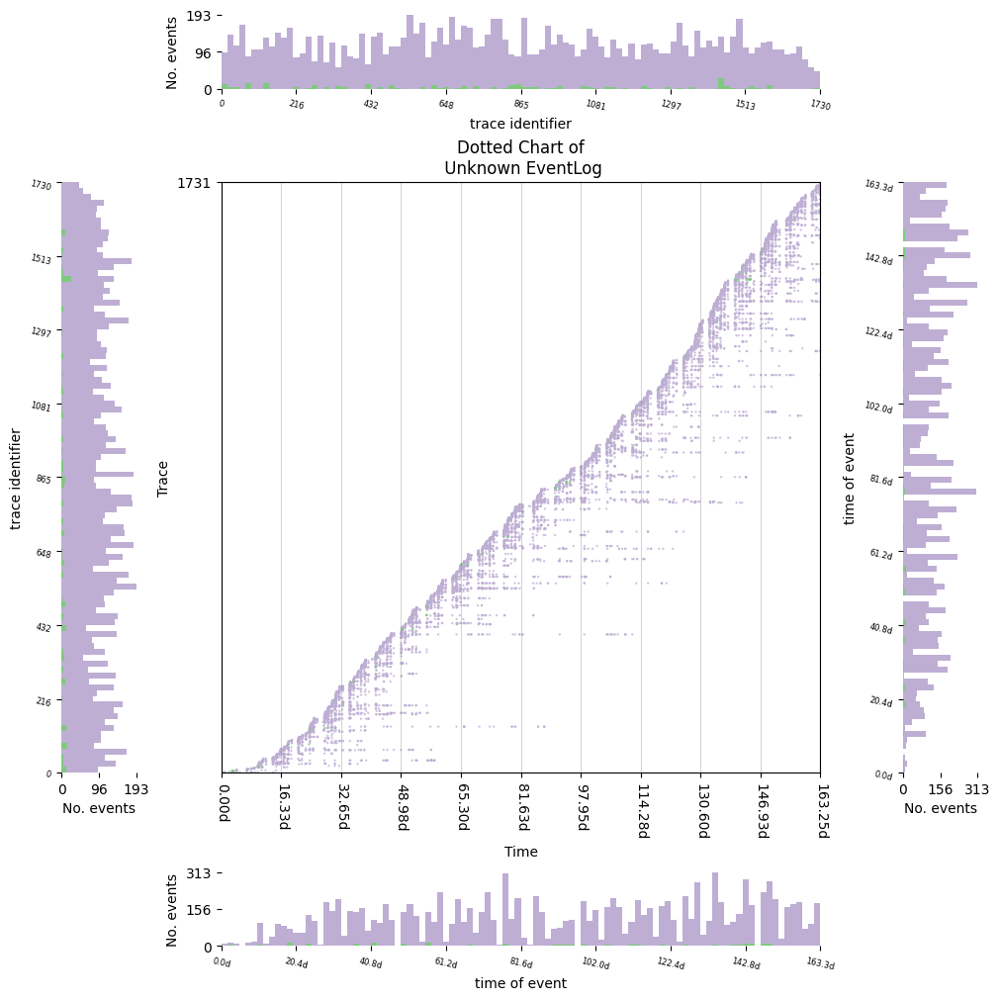

In [ ]:
# DottedColourHistogramExtension
#This extension plots a histogram based on the events within a dotted chart. Events will be broken down by colour for each bin.
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL


presentor = StaticDottedChartPresentor(bpi2012_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=CATEGORICAL
)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.NORTH)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.SOUTH,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.WEST)
presentor.add_extension(ext)
ext = DottedColourHistogramExtension(direction=DottedColourHistogramExtension.Direction.EAST,
         bin_axes=DottedColourHistogramExtension.PlotAxes.X)
presentor.add_extension(ext)
presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Beoordelen fraude': 'A', 'W_Nabellen incomplete dossiers': 'B'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Beoordelen fraude': 'A', 'W_Nabellen incomplete dossiers': 'B'} 
[DottedEventHistogramExtensi

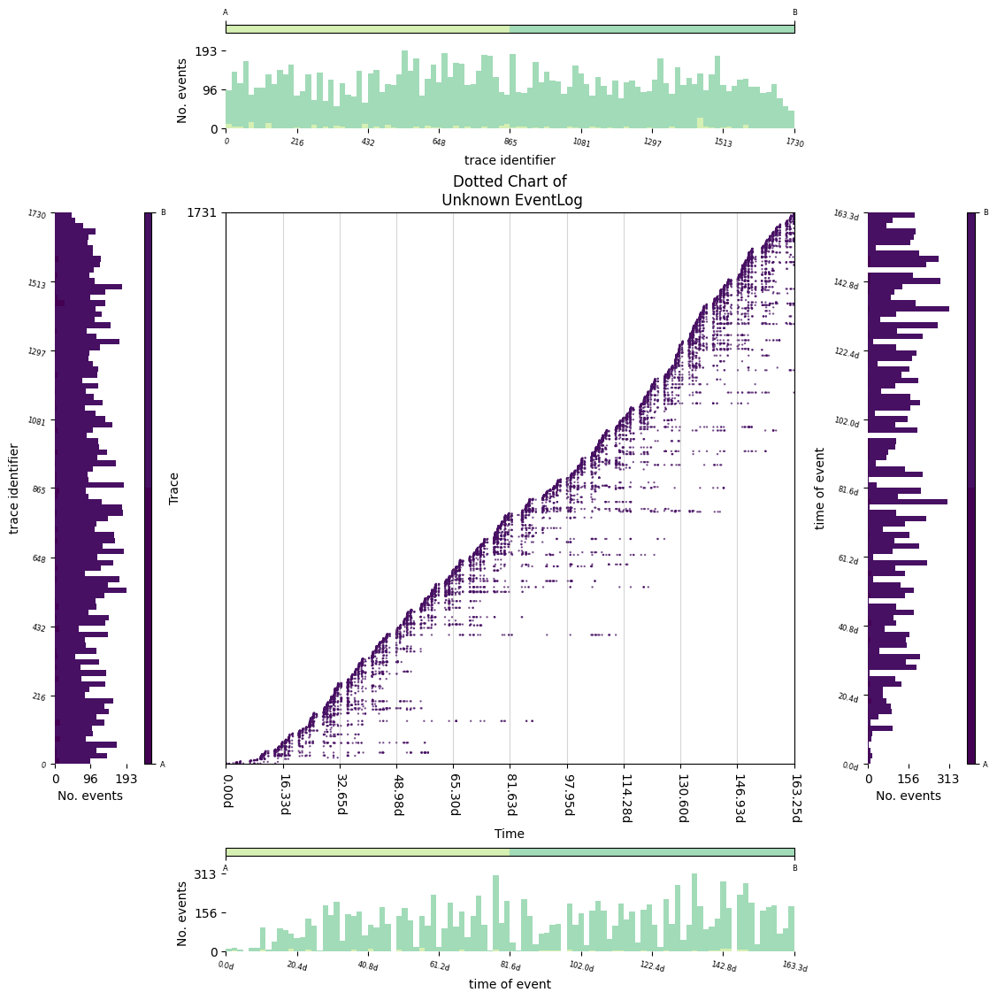

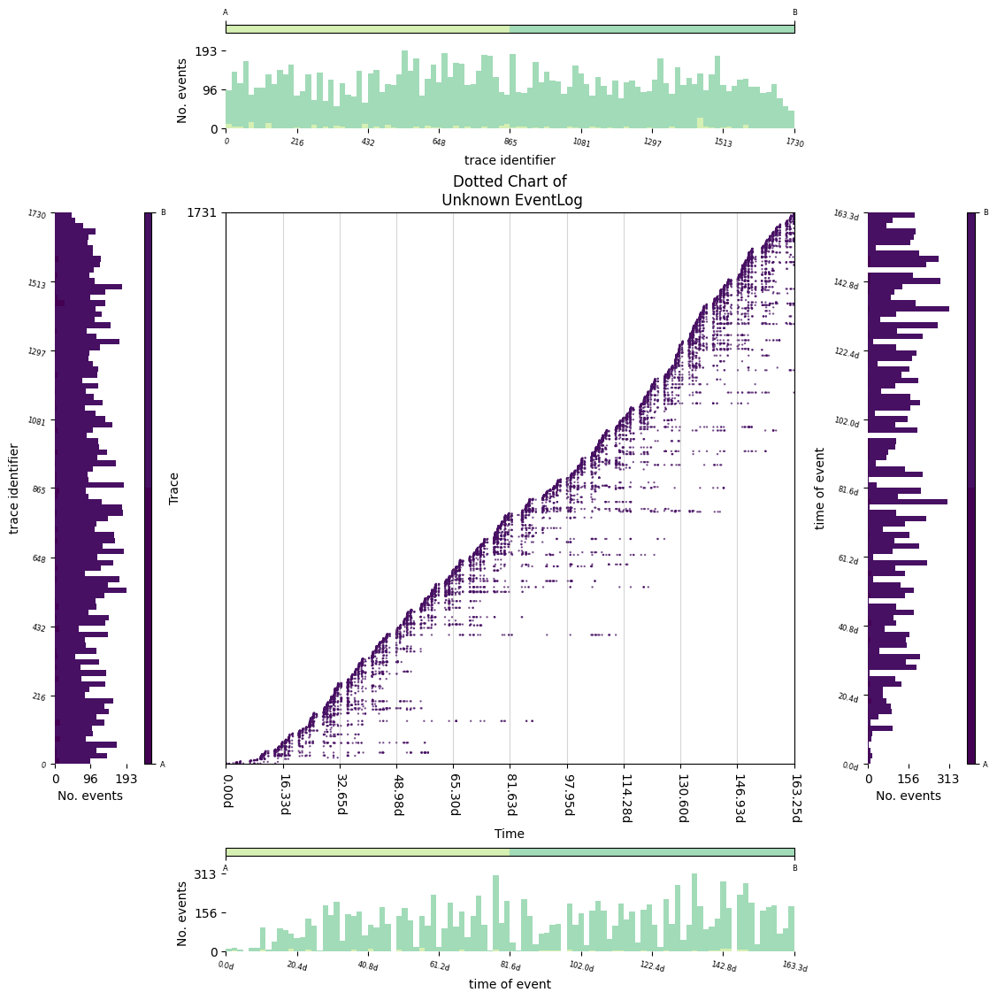

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM
from vispm.helpers.colours.colourmaps import EARTH,COOL_WINTER
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(bpi2012_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Added extension : DottedEventHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Beoordelen fraude': 'A', 'W_Nabellen incomplete dossiers': 'B'} 
[DottedEventHistogramExtension] ploting histogram... 
[DottedEventHistogramExtension] Event labels are imputed as :: {'W_Beoordelen fraude': 'A', 'W_Nabellen incomplete dossiers': 'B'} 
[DottedEventHistogramExtensi

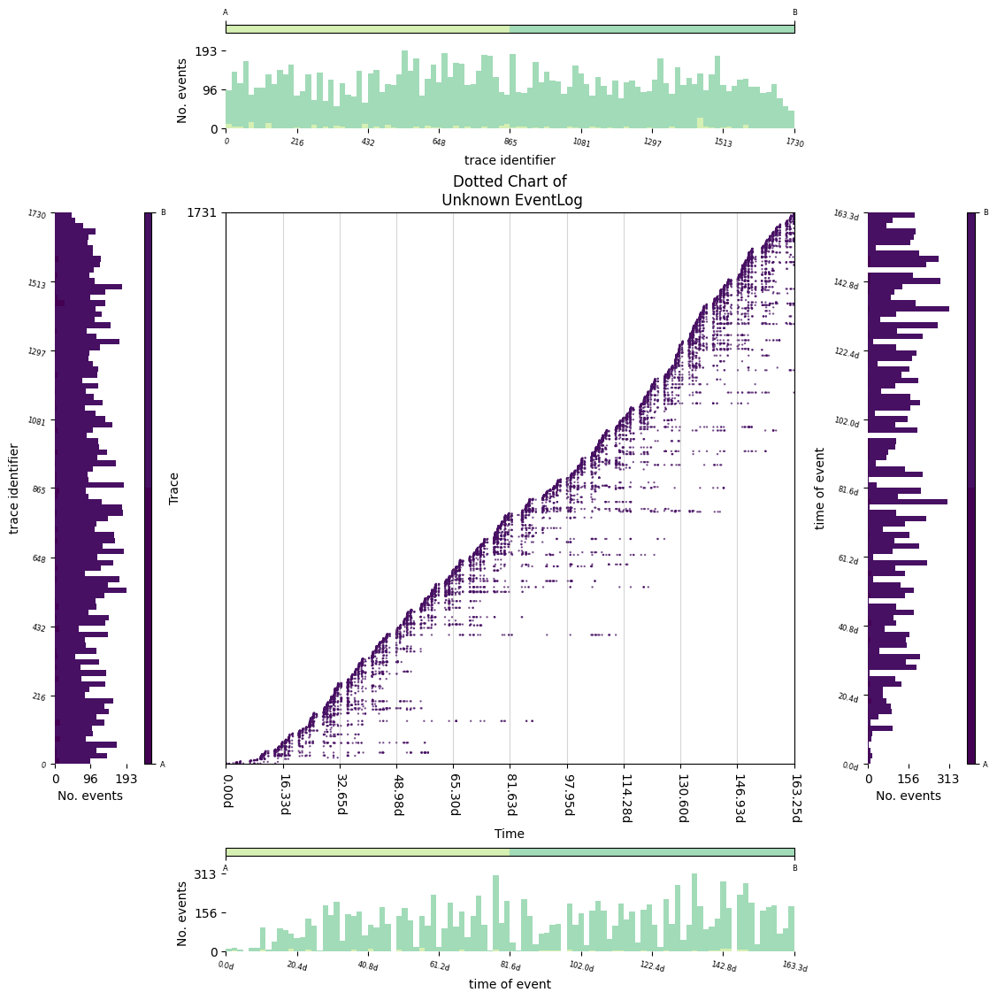

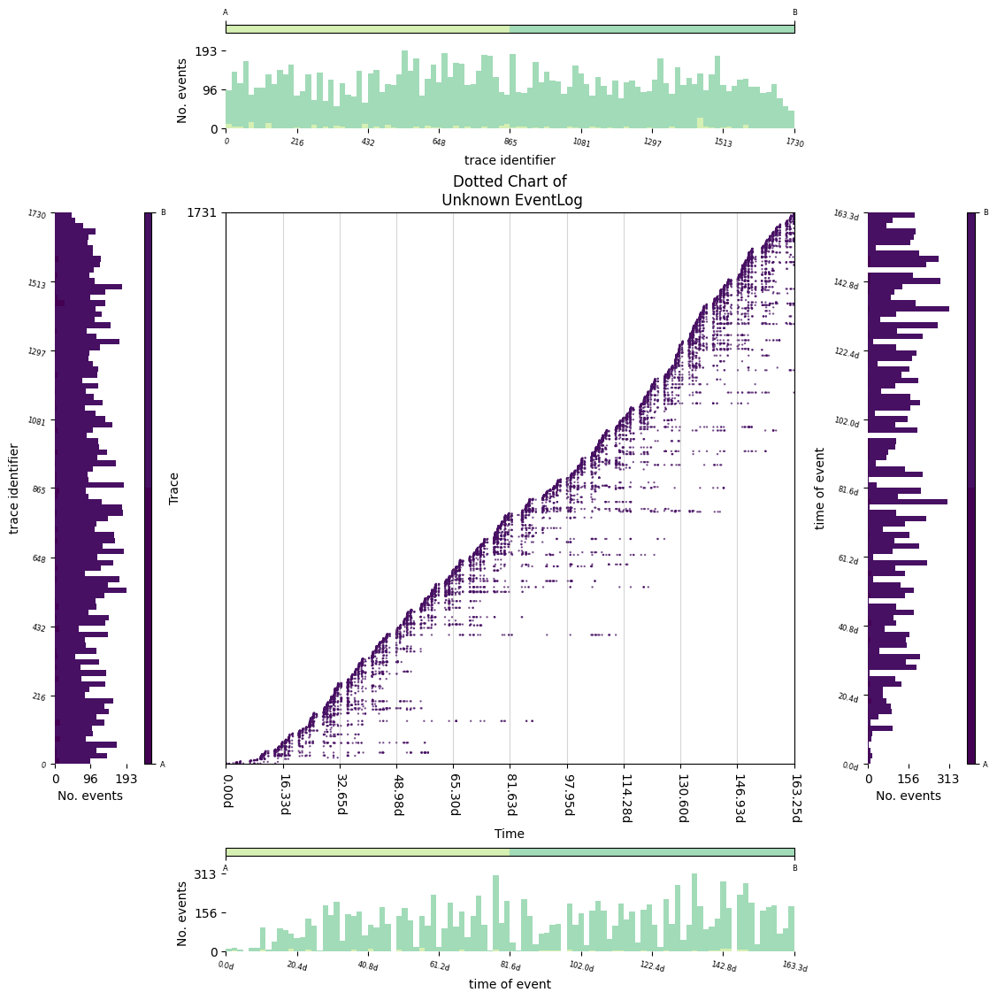

In [ ]:
# 1. setup up colour schemes to use
from vispm import StaticDottedChartPresentor, DottedColourHistogramExtension, DottedEventHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension

import numpy as np
from matplotlib.colors import ListedColormap
from matplotlib.cm import get_cmap

colourmaps = [COOL_WINTER,EARTH,HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM, CATEGORICAL]
seq_colourmap = np.vstack(
    (
    colourmaps[0](np.linspace(0.20,1,8)),
    colourmaps[1](np.linspace(0.20,1,8)),
    colourmaps[2](np.linspace(0.20,1,8)),
    colourmaps[3](np.linspace(0.20,1,8)),
    colourmaps[4](np.linspace(0.20,1,8))
    
    )
)
seq_colourmap = ListedColormap(seq_colourmap, name='VARIANCE')
cmap = get_cmap(HIGH_CONTRAST_COOL, 26)


# 2. create a presentor and add extensions
presentor = StaticDottedChartPresentor(bpi2012_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.SOUTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.NORTH,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=seq_colourmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.WEST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.Y,
    colourmap=cmap
)
presentor.add_extension(ext)
ext = DottedEventHistogramExtension(
    direction=DottedEventHistogramExtension.Direction.EAST,
    bin_axes=DottedEventHistogramExtension.PlotAxes.X,
    colourmap=cmap
)
presentor.add_extension(ext)

presentor.plot()

[StaticDottedChartPresentor] Processing event data... 
[StaticDottedChartPresentor] Cannot find concept:name in eventlog attributes. 
[StaticDottedChartPresentor] Ready to plot... 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Added extension : DescriptionHistogramExtension 
[StaticDottedChartPresentor] Compiling finished...         
[StaticDottedChartPresentor] Plotting data... 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] Event labels are imputed as :: {'W_Beoordelen fraude': 'A', 'W_Nabellen incomplete dossiers': 'B'} 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[DescriptionHistogramExtension] plotting histogram 
[StaticDottedChartPresentor] Cleaning up plot... 
[StaticDot

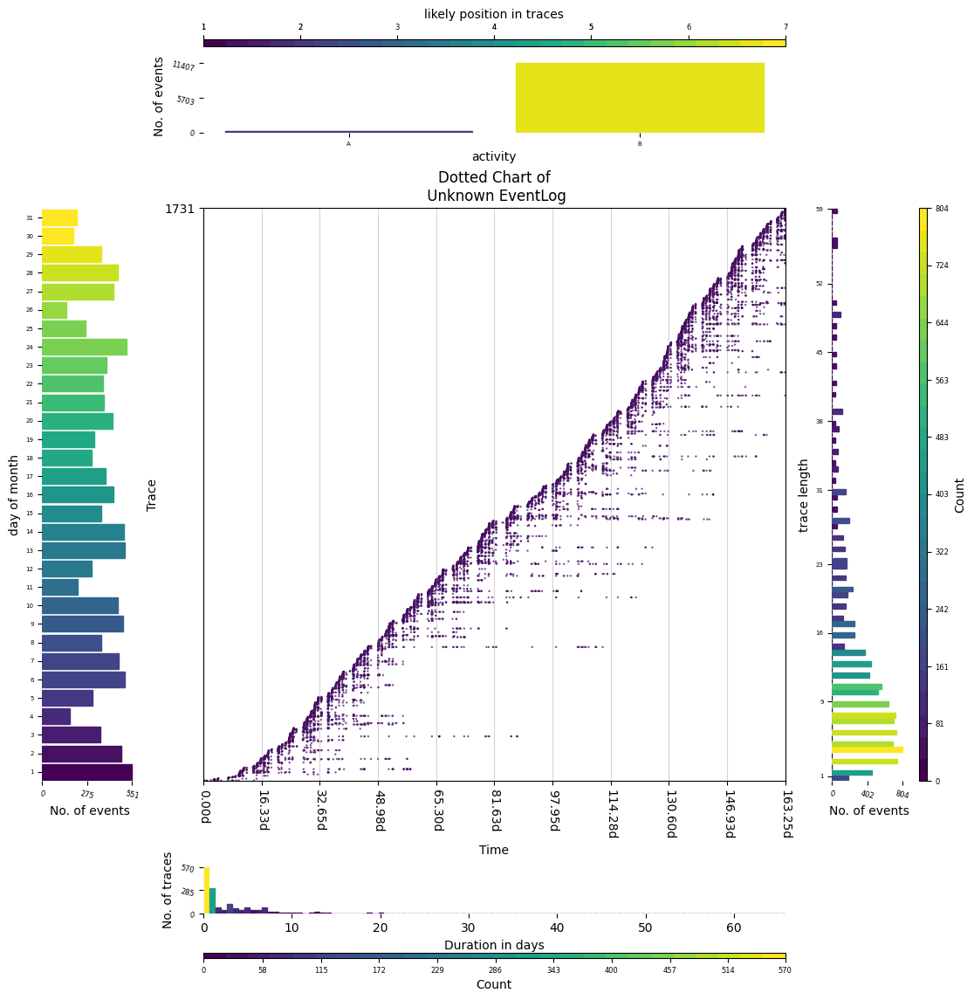

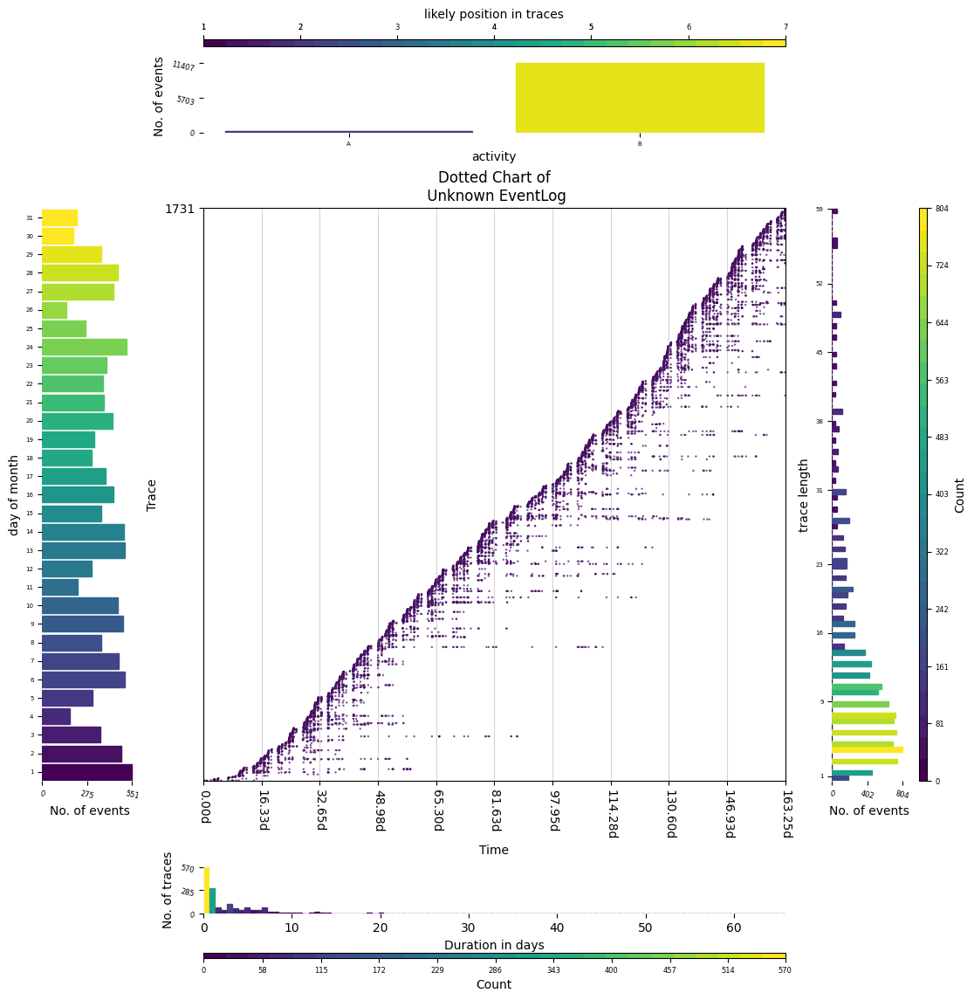

In [ ]:
#DescriptionHistogramExtension
#This extension describes an aspect of the event log.
# For example, a breakdown of trace duration, or trace length (by the number of activities), or event label, or when events occur (weekday or monthday).

#The following example shows how to use this extension to understand the properties of event log, alongside a dotted chart.


from vispm import DescriptionHistogramExtension
from vispm.helpers.colours.colourmaps import HIGH_CONTRAST_COOL,HIGH_CONTRAST_WARM,EARTH,COOL_WINTER,CATEGORICAL
from vispm import StaticDottedChartPresentor,DottedColourHistogramExtension


cmap = get_cmap(HIGH_CONTRAST_COOL, 26)
presentor = StaticDottedChartPresentor(bpi2012_event_log,dpi=100,
    event_colour_scheme=StaticDottedChartPresentor.EventColourScheme.EventLabel,
    colormap=cmap
)

ext = DescriptionHistogramExtension(
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.EAST,
    describe=DescriptionHistogramExtension.Describe.TraceLength,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.SOUTH,
    describe=DescriptionHistogramExtension.Describe.TraceDuration,
    density=DescriptionHistogramExtension.Density.Trace
)
presentor.add_extension(ext)

ext = DescriptionHistogramExtension(
    direction=DescriptionHistogramExtension.Direction.WEST,
    describe=DescriptionHistogramExtension.Describe.Monthday,
    density=DescriptionHistogramExtension.Density.Event
)
presentor.add_extension(ext)

presentor.plot()